In [94]:
import pathlib

# Define data directory
train_dir = pathlib.Path('C:\\Users\\yoni mazin\\Downloads\\new\\data\\train')
test_dir = pathlib.Path('C:\\Users\\yoni mazin\\Downloads\\new\\data\\test')
train_masks_dir = pathlib.Path('C:\\Users\\yoni mazin\\Downloads\\new\\masks\\train')
test_masks_dir = pathlib.Path('C:\\Users\\yoni mazin\\Downloads\\new\\masks\\test')

In [95]:
import os
import cv2
import numpy as np

# check if the pixels are normalized
img = cv2.imread(os.path.join(test_dir, 'P1MF1_C.png'), cv2.IMREAD_GRAYSCALE)
print(np.max(img), np.min(img))
img_mask = cv2.imread(os.path.join(test_masks_dir, 'P1MF1_C.Png'), cv2.IMREAD_GRAYSCALE)
print(np.max(img_mask), np.min(img_mask))
print(img.shape, img_mask.shape)

255 0
255 0
(4096, 4096) (4096, 4096)


In [96]:
X_train = []
y_train = []
X_test = []
y_test = []

for img_path in train_dir.glob('*.png'):
    img = cv2.imread(str(img_path))
    img = cv2.resize(img, (256, 256))
    X_train.append(img)
    mask_path = os.path.join(train_masks_dir, img_path.stem + '.Png')
    img_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    img_mask = cv2.resize(img_mask, (256, 256))
    y_train.append(img_mask)

for img_path in test_dir.glob('*.png'):
    img = cv2.imread(str(img_path))
    img = cv2.resize(img, (256, 256))
    X_test.append(img)
    mask_path = os.path.join(test_masks_dir, img_path.stem + '.Png')
    img_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    img_mask = cv2.resize(img_mask, (256, 256))
    y_test.append(img_mask)

X_train = np.array(X_train)
y_train = np.array(y_train)
X_test = np.array(X_test)
y_test = np.array(y_test)

# # Expand the dimensions of the images
#X_train = np.expand_dims(X_train, axis = 3)
y_train = np.expand_dims(y_train, axis = 3)
#X_test = np.expand_dims(X_test, axis = 3)
y_test = np.expand_dims(y_test, axis = 3)

print(X_train.shape, y_train.shape)

(50, 256, 256, 3) (50, 256, 256, 1)


In [97]:
import tensorflow as tf

train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test))

In [98]:
def normalize(input_image, input_mask):
    input_image = tf.cast(input_image, tf.float32) / 255.0
    input_mask = tf.round(tf.cast(input_mask, tf.float32) / 255.0)
    return input_image, input_mask

def load_image(input_image, input_mask):
    input_image = tf.image.resize(input_image, (128, 128))
    input_mask = tf.image.resize(input_mask,(128, 128), method = tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    input_image, input_mask = normalize(input_image, input_mask)
    return input_image, input_mask

In [99]:
TRAIN_LENGTH = len(X_train)
BATCH_SIZE = 8
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

In [100]:
train_ds = train_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)
test_ds = test_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)

print("the shape of the train dataset is: ", train_ds)
# Show the labels of the first image
for image, mask in train_ds.take(1):
    print("the shape of the image is: ", image.numpy().shape)
    print("the shape of the mask is: ", mask.numpy().shape)
    print("the label of the first image is: ", mask.numpy())

the shape of the train dataset is:  <_ParallelMapDataset element_spec=(TensorSpec(shape=(128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(128, 128, 1), dtype=tf.float32, name=None))>
the shape of the image is:  (128, 128, 3)
the shape of the mask is:  (128, 128, 1)
the label of the first image is:  [[[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 ...

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]]


In [101]:
class Augment(tf.keras.layers.Layer):
  def __init__(self, seed=42):
    super().__init__()
    # both use the same seed, so they'll make the same random changes.
    self.augment_inputs = tf.keras.layers.RandomFlip(mode="horizontal", seed=seed)
    self.augment_labels = tf.keras.layers.RandomFlip(mode="horizontal", seed=seed)

  def call(self, inputs, labels):
    inputs = self.augment_inputs(inputs)
    labels = self.augment_labels(labels)
    return inputs, labels

In [102]:
train_batches = (
    train_ds
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
    .repeat()
    .map(Augment())
    .prefetch(buffer_size=tf.data.AUTOTUNE))

test_batches = test_ds.batch(BATCH_SIZE)

In [103]:
from matplotlib import pyplot as plt

def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

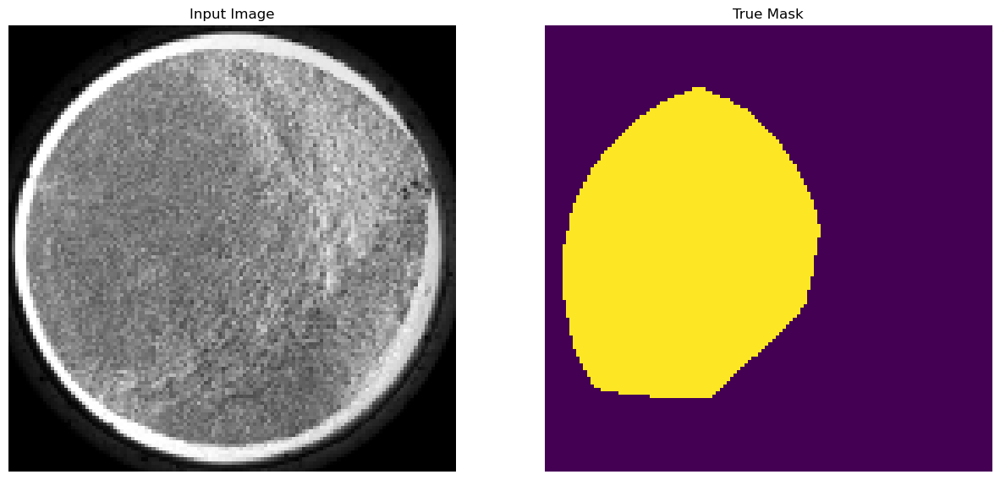

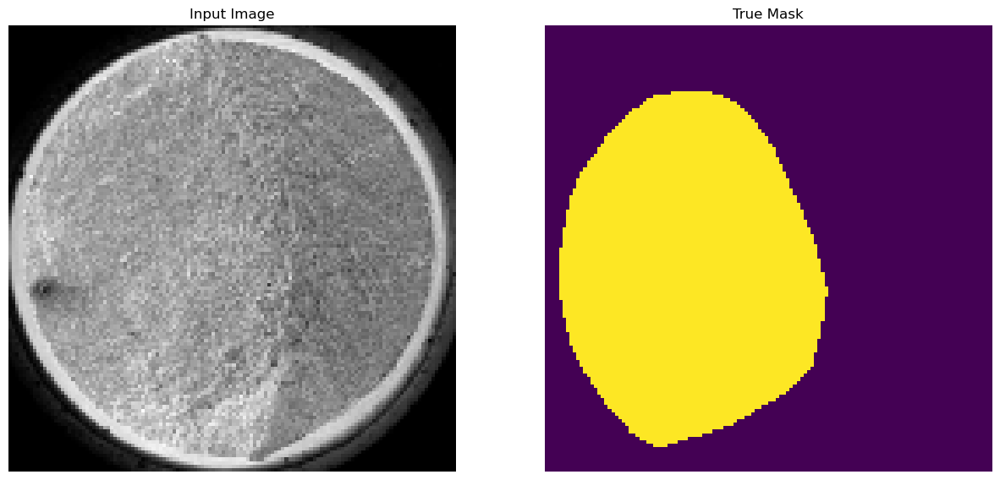

In [104]:
for images, masks in train_batches.take(2):
  sample_image, sample_mask = images[0], masks[0]
  display([sample_image, sample_mask])

In [105]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

down_stack.trainable = False

In [106]:
from tensorflow_examples.models.pix2pix import pix2pix

up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]

<h3 style="color:blue">
this is the part where we try to reduce the complexity of the Unet by reucing the number of layers.
    
as we know, the encoder part is to reduce the dimensions of the image and extract high level features from the input image.
    
the decoder is resposible for reconstruct the segmented output with the same dimensions as the input. </h3>

In [107]:
import tensorflow as tf

def simplified_unet(output_channels: int):
    inputs = tf.keras.layers.Input(shape=(128, 128, 3)) # this is the input layer. the image is 128*128 and there are 3 color chanels

    # the encoder, downsampling part
    # adding the first convolutional layer with 32 filters, relu activation function, and padding
    conv1 = tf.keras.layers.Conv2D(32, 3, activation='relu', padding='same')(inputs)
    
    # adding max-pooling.
    # max-pooling is a downscaling operation commonly used in convolutional neural networks (CNNs)
    # to reduce the spatial dimensions of feature maps.
    # it retain the most important information while reducing the spatial size
    pool1 = tf.keras.layers.MaxPooling2D()(conv1)

    # bottleneck.
    # adding a single convolutional layer with 64 filters.
    # it serves as the bottleneck connecting the encoder and decoder.
    conv_bottleneck = tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same')(pool1)

    # decoder upsampling part.
    # increase the spatial resolution of the feature maps. The output has the same dimensions as the input.
    up1 = tf.keras.layers.Conv2DTranspose(32, 2, strides=(2, 2), padding='same', activation='relu')(conv_bottleneck)

    # adding final convolutional layer that produces the output segmentation mask.
    outputs = tf.keras.layers.Conv2D(output_channels, 1, activation='softmax')(up1)

    return tf.keras.Model(inputs=inputs, outputs=outputs)

# Create the simplified U-Net model with 2 output classes
OUTPUT_CLASSES = 2
model = simplified_unet(output_channels=OUTPUT_CLASSES)
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])


<h3 style="color:red"> this is the original unet model, dont run it, it is overfit. </h3>

In [14]:
def unet_model(output_channels:int):
  inputs = tf.keras.layers.Input(shape=[128, 128, 3])

  # Downsampling through the model
  skips = down_stack(inputs)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      filters=output_channels, kernel_size=3, strides=2,
      padding='same')  #64x64 -> 128x128

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

<h3 style="color:red"> this is the original unet model, dont run it, it is overfit. </h3>

In [15]:
OUTPUT_CLASSES = 2

model = unet_model(output_channels=OUTPUT_CLASSES)
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

<h3 style="color:blue"> continue to run the code from here. </h3>

In [108]:
# Try the model
def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

In [109]:
def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])
  else:
    display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])

1/1 [==============================] - 0s 105ms/step


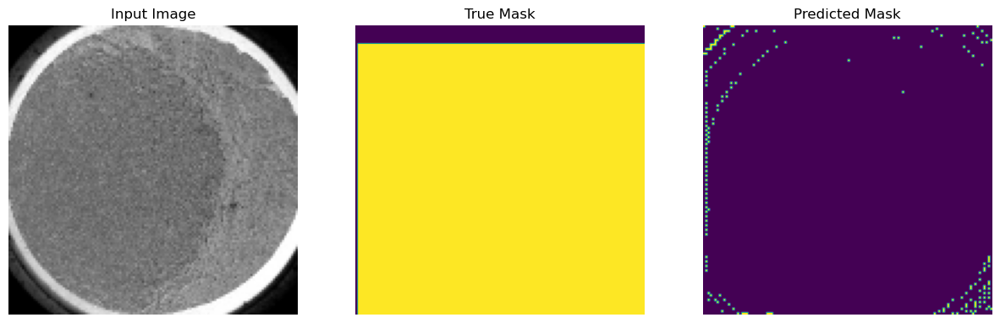

1/1 [==============================] - 0s 66ms/step


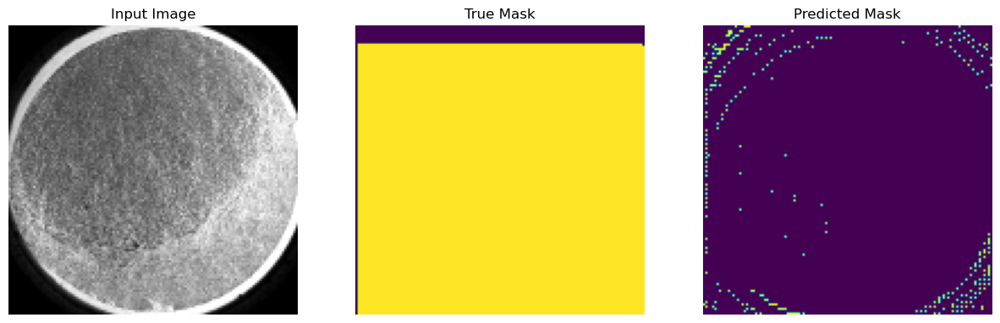

1/1 [==============================] - 0s 56ms/step


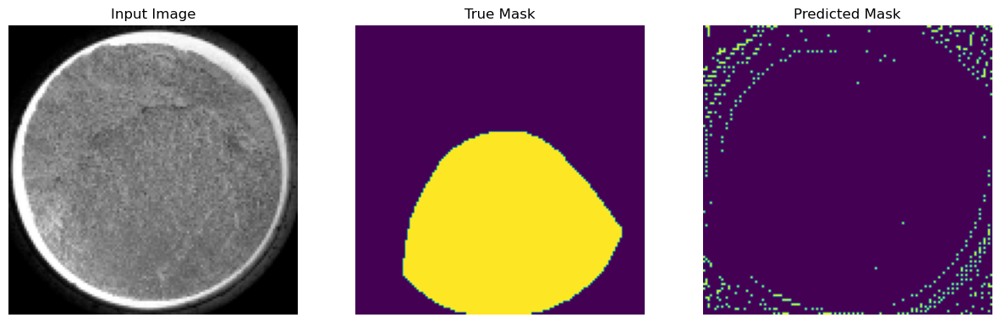

In [110]:
show_predictions(train_batches, 3)

In [111]:
from IPython.display import clear_output

class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    #clear_output(wait=True)
    show_predictions(train_batches, 1)
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

Epoch 1/200
1/1 [==============================] - 0s 56ms/stepss: 0.6841 - accuracy: 0.62


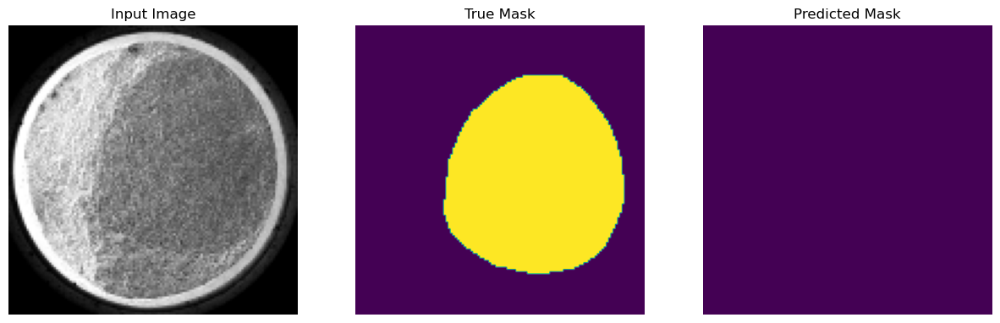


Sample Prediction after epoch 1

6/6 [==============================] - 2s 263ms/step - loss: 0.6841 - accuracy: 0.6220 - val_loss: 0.6900 - val_accuracy: 0.5946
Epoch 2/200
1/1 [==============================] - 0s 60ms/stepss: 0.6832 - accuracy: 0.60


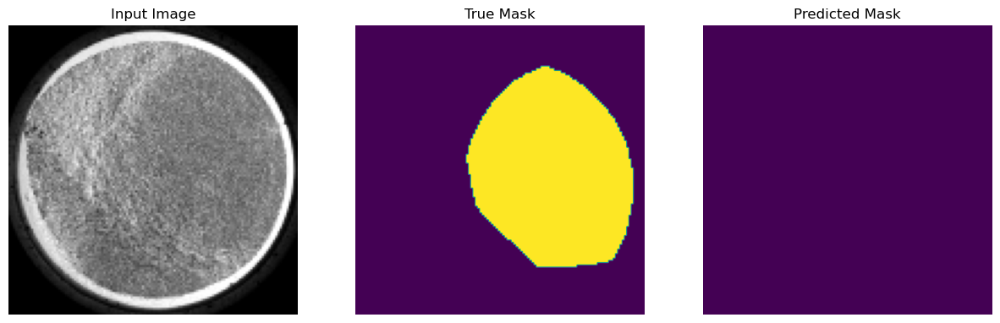


Sample Prediction after epoch 2

6/6 [==============================] - 1s 263ms/step - loss: 0.6832 - accuracy: 0.6073 - val_loss: 0.6809 - val_accuracy: 0.5946
Epoch 3/200
1/1 [==============================] - 0s 63ms/stepss: 0.6754 - accuracy: 0.61


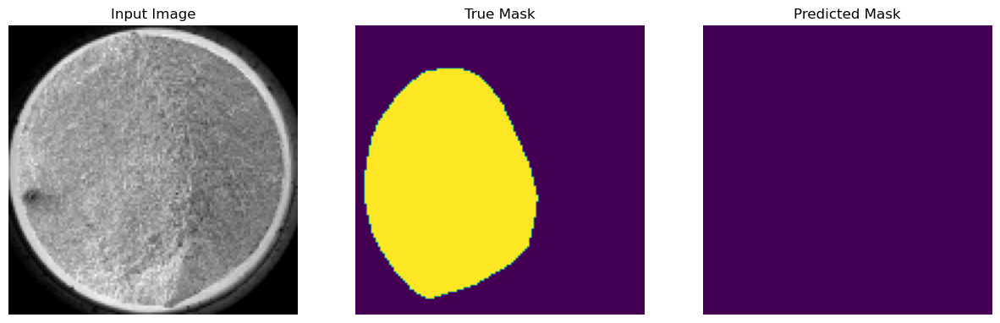


Sample Prediction after epoch 3

6/6 [==============================] - 1s 247ms/step - loss: 0.6754 - accuracy: 0.6130 - val_loss: 0.6755 - val_accuracy: 0.5946
Epoch 4/200
1/1 [==============================] - 0s 298ms/steps: 0.6690 - accuracy: 0.60


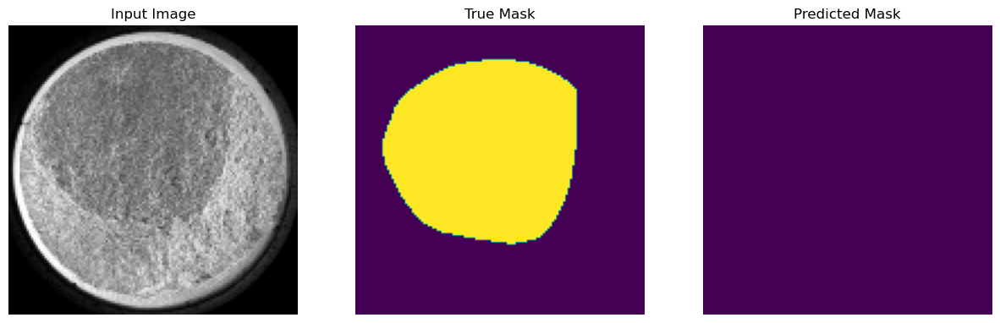


Sample Prediction after epoch 4

6/6 [==============================] - 5s 991ms/step - loss: 0.6690 - accuracy: 0.6083 - val_loss: 0.6636 - val_accuracy: 0.5946
Epoch 5/200
1/1 [==============================] - 0s 56ms/stepss: 0.6489 - accuracy: 0.62


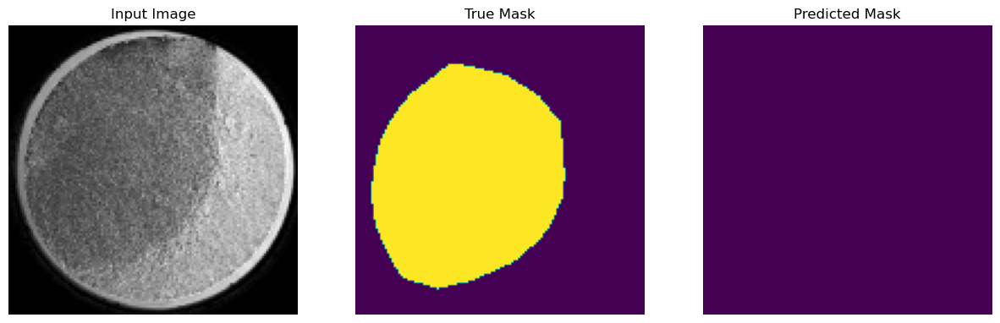


Sample Prediction after epoch 5

6/6 [==============================] - 3s 427ms/step - loss: 0.6489 - accuracy: 0.6294 - val_loss: 0.6459 - val_accuracy: 0.5946
Epoch 6/200
1/1 [==============================] - 0s 56ms/stepss: 0.6275 - accuracy: 0.62


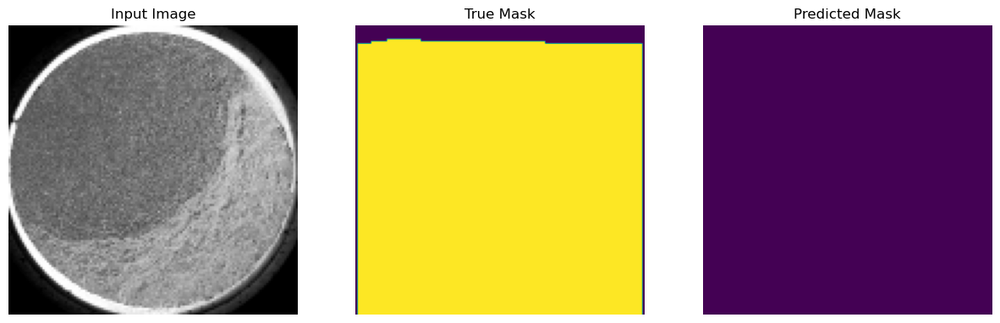


Sample Prediction after epoch 6

6/6 [==============================] - 1s 203ms/step - loss: 0.6275 - accuracy: 0.6209 - val_loss: 0.6222 - val_accuracy: 0.5946
Epoch 7/200
1/1 [==============================] - 0s 56ms/stepss: 0.5956 - accuracy: 0.62


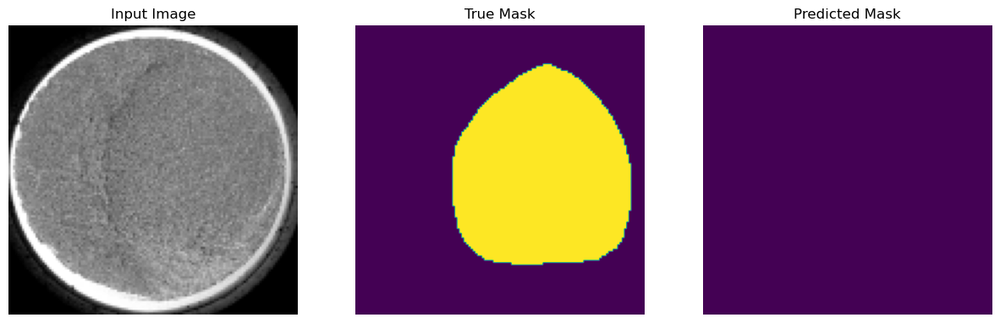


Sample Prediction after epoch 7

6/6 [==============================] - 1s 203ms/step - loss: 0.6038 - accuracy: 0.6099 - val_loss: 0.5947 - val_accuracy: 0.5946
Epoch 8/200
1/1 [==============================] - 0s 68ms/stepss: 0.5744 - accuracy: 0.61


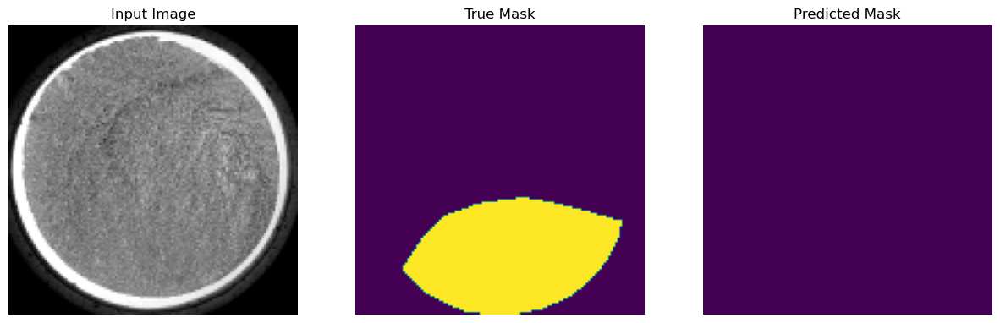


Sample Prediction after epoch 8

6/6 [==============================] - 1s 233ms/step - loss: 0.5744 - accuracy: 0.6156 - val_loss: 0.5796 - val_accuracy: 0.5946
Epoch 9/200
1/1 [==============================] - 0s 73ms/stepss: 0.5486 - accuracy: 0.62


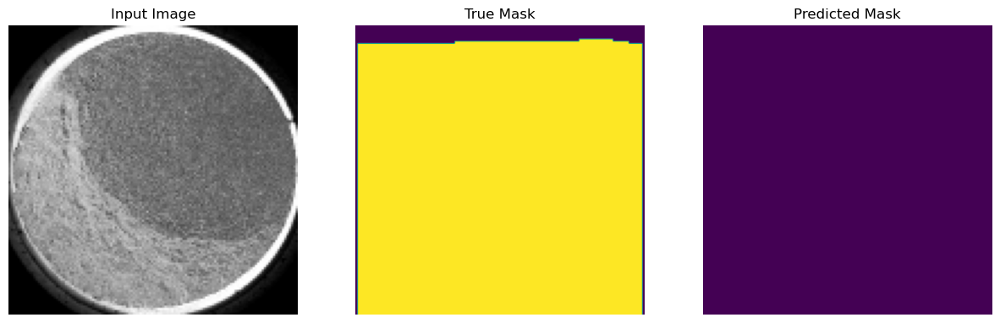


Sample Prediction after epoch 9

6/6 [==============================] - 1s 257ms/step - loss: 0.5486 - accuracy: 0.6273 - val_loss: 0.5757 - val_accuracy: 0.5946
Epoch 10/200
1/1 [==============================] - 0s 59ms/stepss: 0.5694 - accuracy: 0.59


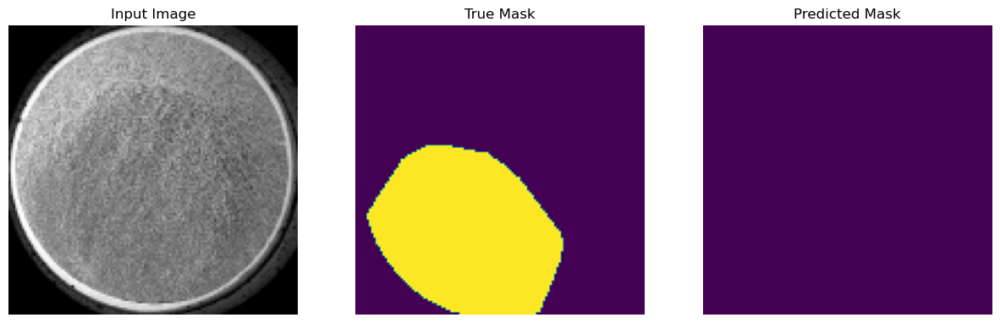


Sample Prediction after epoch 10

6/6 [==============================] - 1s 260ms/step - loss: 0.5694 - accuracy: 0.5952 - val_loss: 0.5779 - val_accuracy: 0.5946
Epoch 11/200
1/1 [==============================] - 0s 186ms/steps: 0.5310 - accuracy: 0.62


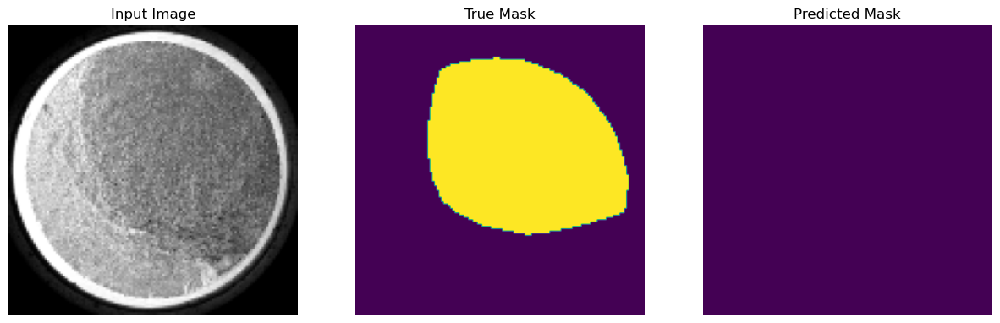


Sample Prediction after epoch 11

6/6 [==============================] - 4s 741ms/step - loss: 0.5310 - accuracy: 0.6266 - val_loss: 0.5797 - val_accuracy: 0.5946
Epoch 12/200
1/1 [==============================] - 0s 257ms/steps: 0.5479 - accuracy: 0.61


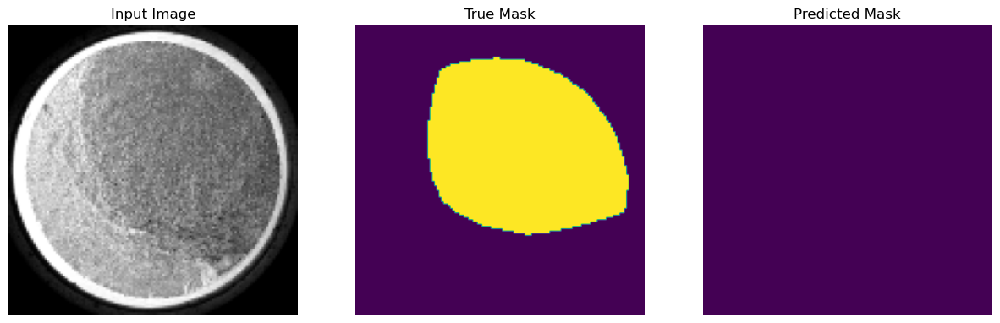


Sample Prediction after epoch 12

6/6 [==============================] - 3s 592ms/step - loss: 0.5479 - accuracy: 0.6129 - val_loss: 0.5789 - val_accuracy: 0.5946
Epoch 13/200
1/1 [==============================] - 0s 58ms/stepss: 0.5324 - accuracy: 0.62


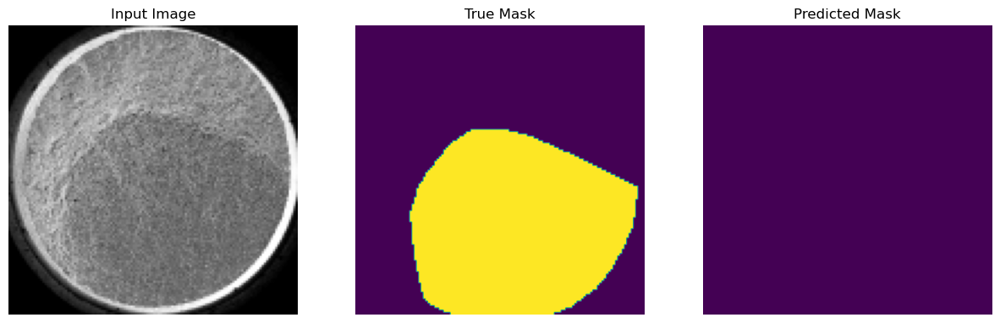


Sample Prediction after epoch 13

6/6 [==============================] - 1s 230ms/step - loss: 0.5324 - accuracy: 0.6245 - val_loss: 0.5780 - val_accuracy: 0.5946
Epoch 14/200
1/1 [==============================] - 0s 56ms/stepss: 0.5534 - accuracy: 0.61


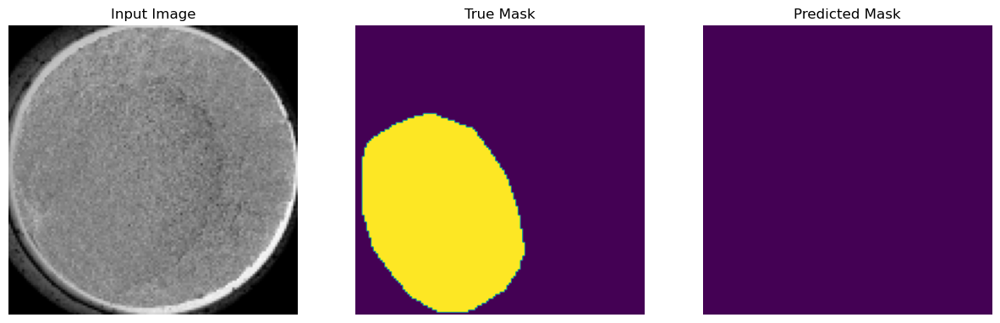


Sample Prediction after epoch 14

6/6 [==============================] - 1s 212ms/step - loss: 0.5511 - accuracy: 0.6140 - val_loss: 0.5760 - val_accuracy: 0.5946
Epoch 15/200
1/1 [==============================] - 0s 58ms/stepss: 0.5413 - accuracy: 0.61


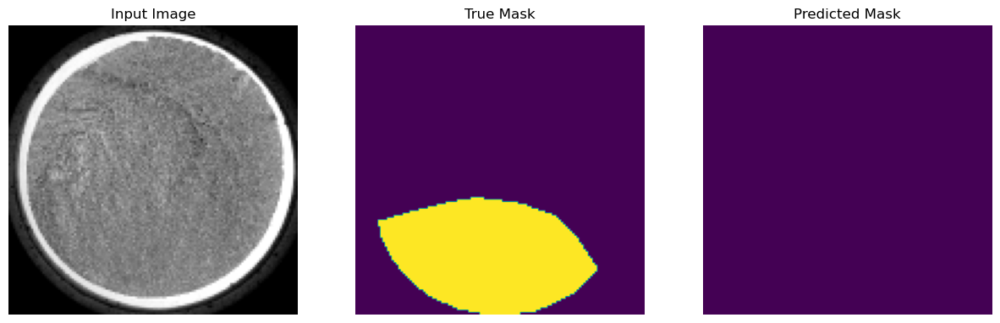


Sample Prediction after epoch 15

6/6 [==============================] - 1s 224ms/step - loss: 0.5413 - accuracy: 0.6170 - val_loss: 0.5727 - val_accuracy: 0.5946
Epoch 16/200
1/1 [==============================] - 0s 55ms/stepss: 0.5196 - accuracy: 0.63


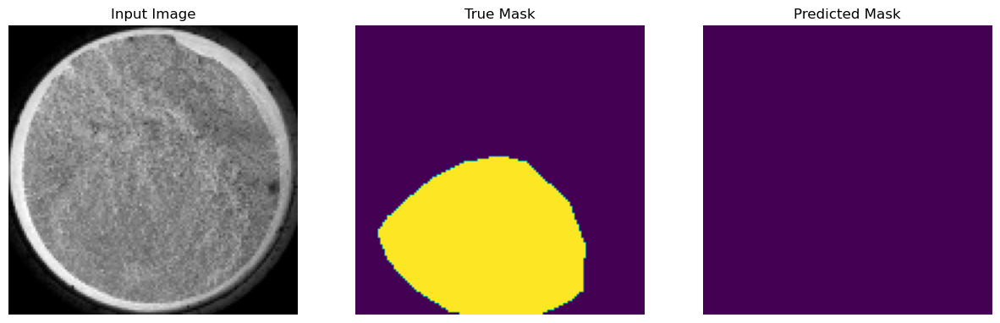


Sample Prediction after epoch 16

6/6 [==============================] - 1s 226ms/step - loss: 0.5196 - accuracy: 0.6396 - val_loss: 0.5738 - val_accuracy: 0.5946
Epoch 17/200
1/1 [==============================] - 0s 55ms/stepss: 0.5551 - accuracy: 0.63


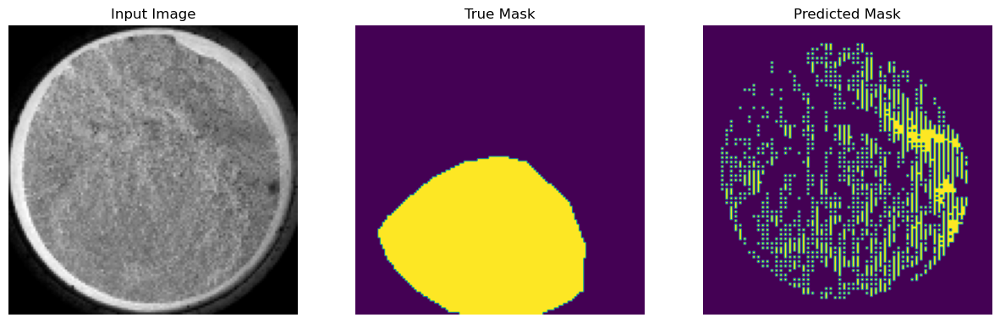


Sample Prediction after epoch 17

6/6 [==============================] - 1s 203ms/step - loss: 0.5551 - accuracy: 0.6320 - val_loss: 0.5665 - val_accuracy: 0.6891
Epoch 18/200
1/1 [==============================] - 0s 183ms/steps: 0.5174 - accuracy: 0.67


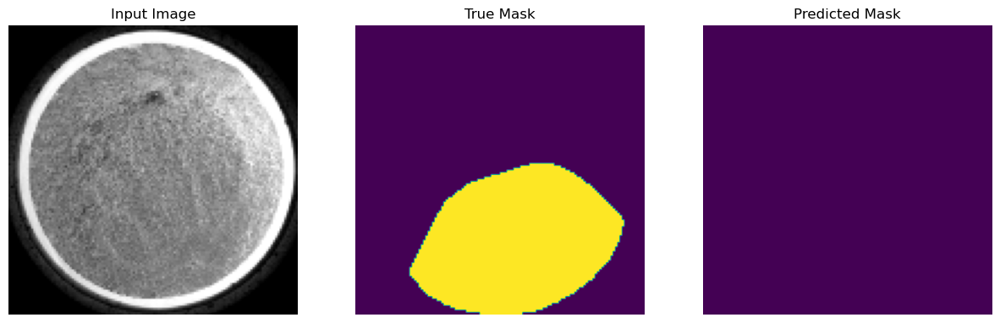


Sample Prediction after epoch 18

6/6 [==============================] - 2s 460ms/step - loss: 0.5174 - accuracy: 0.6718 - val_loss: 0.5725 - val_accuracy: 0.5946
Epoch 19/200
1/1 [==============================] - 0s 185ms/steps: 0.5661 - accuracy: 0.65


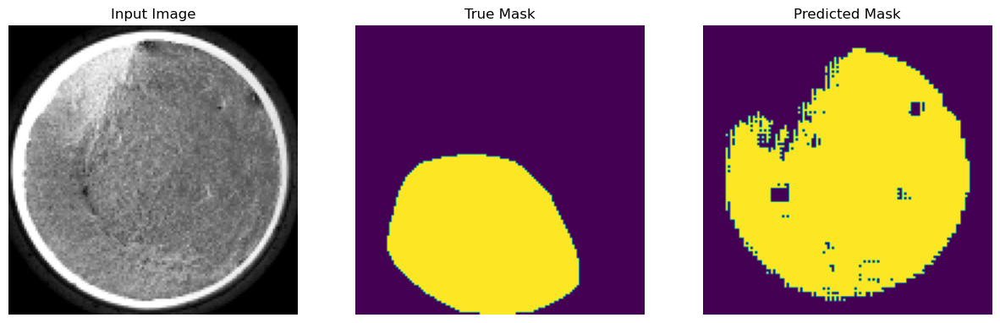


Sample Prediction after epoch 19

6/6 [==============================] - 4s 752ms/step - loss: 0.5661 - accuracy: 0.6506 - val_loss: 0.5602 - val_accuracy: 0.7434
Epoch 20/200
1/1 [==============================] - 0s 54ms/stepss: 0.5087 - accuracy: 0.75


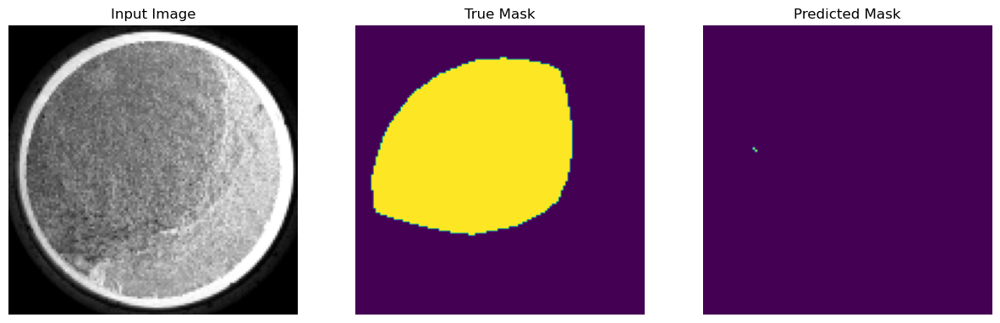


Sample Prediction after epoch 20

6/6 [==============================] - 2s 298ms/step - loss: 0.5087 - accuracy: 0.7539 - val_loss: 0.5655 - val_accuracy: 0.5973
Epoch 21/200
1/1 [==============================] - 0s 59ms/stepss: 0.5345 - accuracy: 0.62


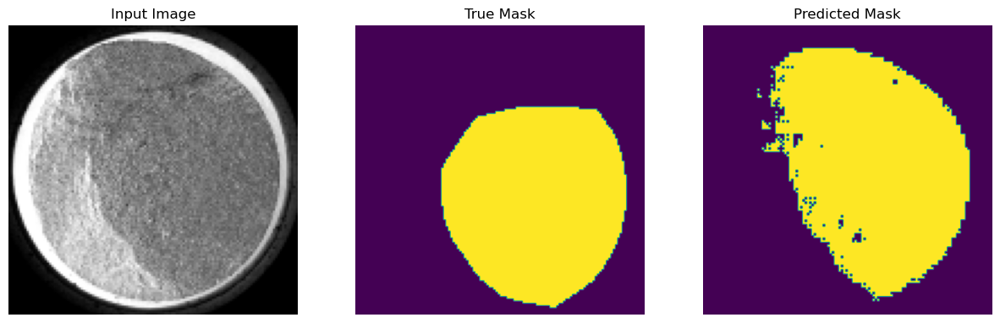


Sample Prediction after epoch 21

6/6 [==============================] - 1s 209ms/step - loss: 0.5320 - accuracy: 0.6273 - val_loss: 0.5540 - val_accuracy: 0.7535
Epoch 22/200
1/1 [==============================] - 0s 59ms/stepss: 0.5196 - accuracy: 0.77


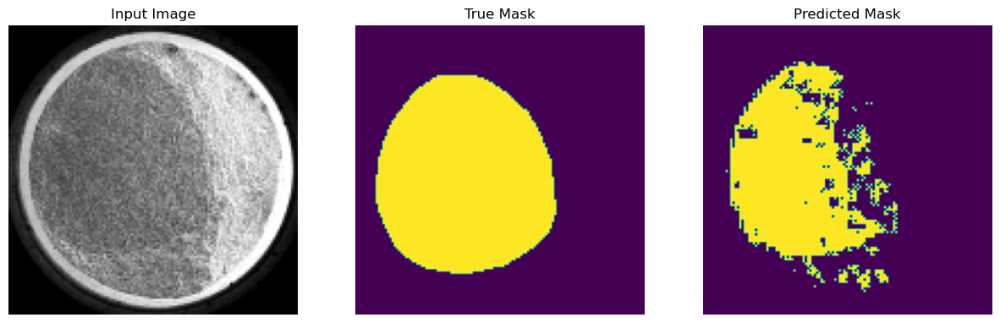


Sample Prediction after epoch 22

6/6 [==============================] - 1s 225ms/step - loss: 0.5196 - accuracy: 0.7726 - val_loss: 0.5520 - val_accuracy: 0.7110
Epoch 23/200
1/1 [==============================] - 0s 56ms/stepss: 0.5258 - accuracy: 0.71


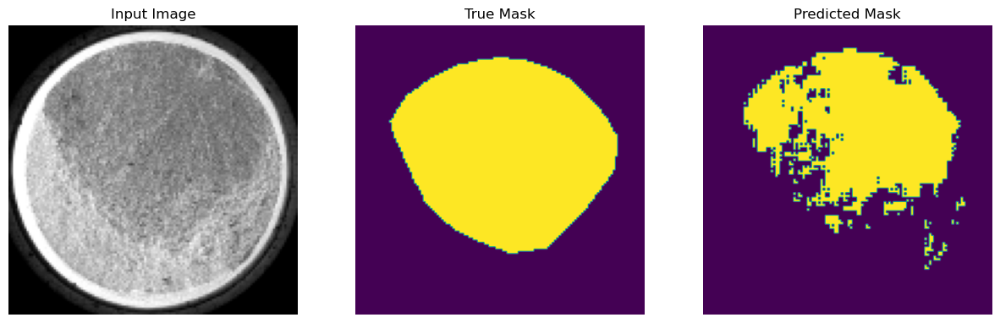


Sample Prediction after epoch 23

6/6 [==============================] - 1s 235ms/step - loss: 0.5258 - accuracy: 0.7161 - val_loss: 0.5439 - val_accuracy: 0.7540
Epoch 24/200
1/1 [==============================] - 0s 221ms/steps: 0.4930 - accuracy: 0.72


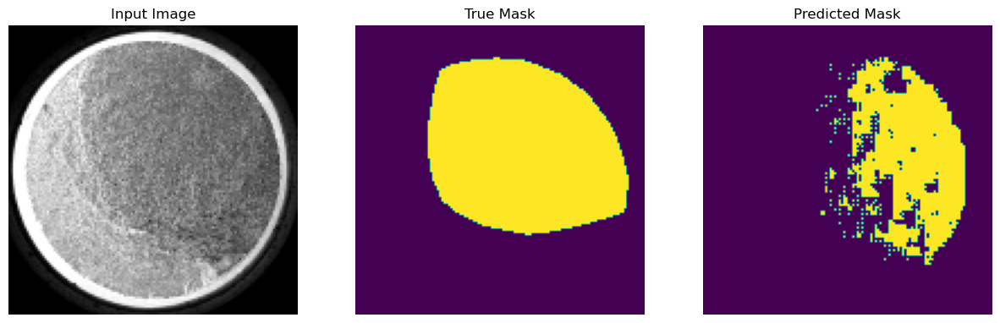


Sample Prediction after epoch 24

6/6 [==============================] - 3s 619ms/step - loss: 0.4930 - accuracy: 0.7259 - val_loss: 0.5477 - val_accuracy: 0.7231
Epoch 25/200
1/1 [==============================] - 0s 206ms/steps: 0.5029 - accuracy: 0.77


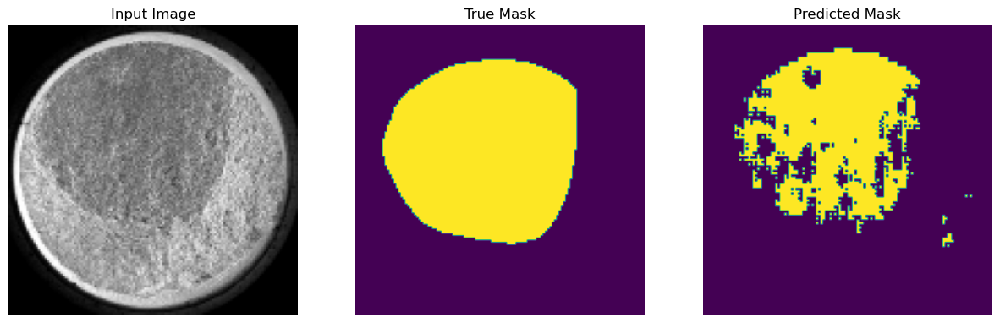


Sample Prediction after epoch 25

6/6 [==============================] - 4s 779ms/step - loss: 0.5029 - accuracy: 0.7779 - val_loss: 0.5395 - val_accuracy: 0.7484
Epoch 26/200
1/1 [==============================] - 0s 55ms/stepss: 0.5312 - accuracy: 0.71


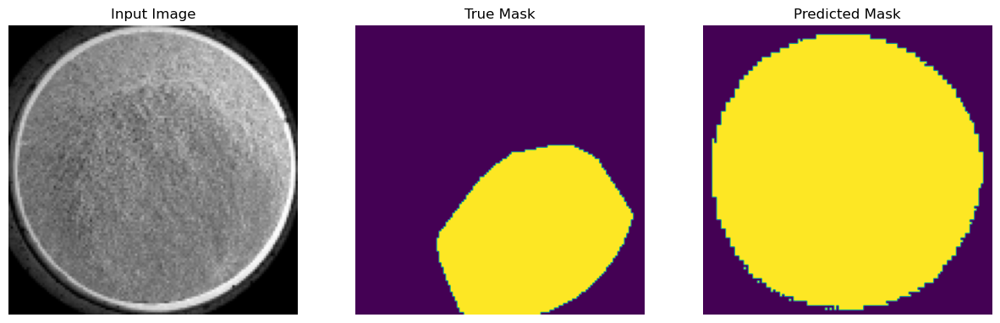


Sample Prediction after epoch 26

6/6 [==============================] - 1s 207ms/step - loss: 0.5312 - accuracy: 0.7109 - val_loss: 0.5497 - val_accuracy: 0.7055
Epoch 27/200
1/1 [==============================] - 0s 58ms/stepss: 0.5330 - accuracy: 0.69


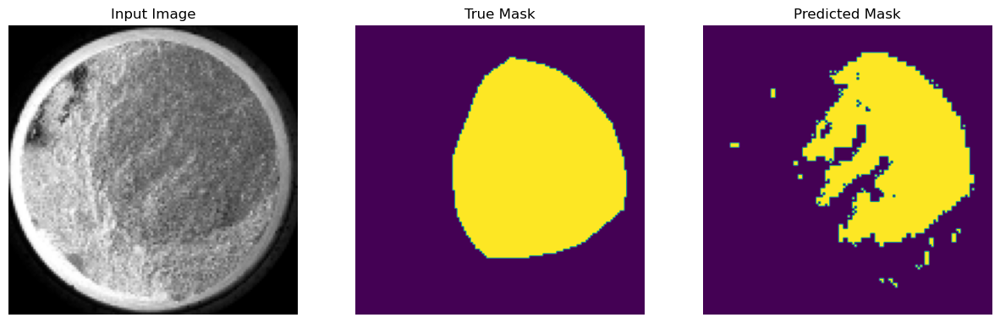


Sample Prediction after epoch 27

6/6 [==============================] - 1s 210ms/step - loss: 0.5330 - accuracy: 0.6995 - val_loss: 0.5340 - val_accuracy: 0.7324
Epoch 28/200
1/1 [==============================] - 0s 60ms/stepss: 0.4674 - accuracy: 0.75


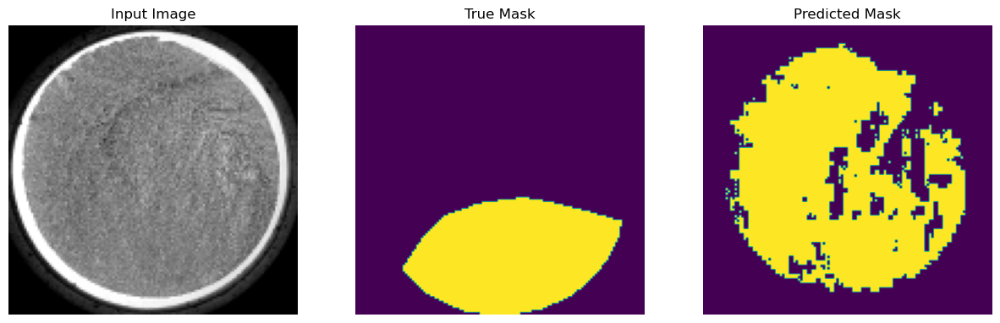


Sample Prediction after epoch 28

6/6 [==============================] - 1s 213ms/step - loss: 0.4653 - accuracy: 0.7540 - val_loss: 0.5268 - val_accuracy: 0.7613
Epoch 29/200
1/1 [==============================] - 0s 57ms/stepss: 0.4878 - accuracy: 0.78


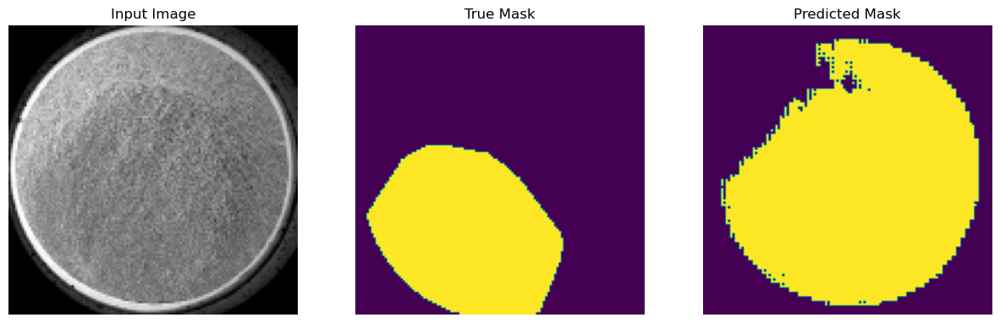


Sample Prediction after epoch 29

6/6 [==============================] - 1s 229ms/step - loss: 0.4878 - accuracy: 0.7851 - val_loss: 0.5233 - val_accuracy: 0.7406
Epoch 30/200
1/1 [==============================] - 0s 55ms/stepss: 0.4759 - accuracy: 0.78


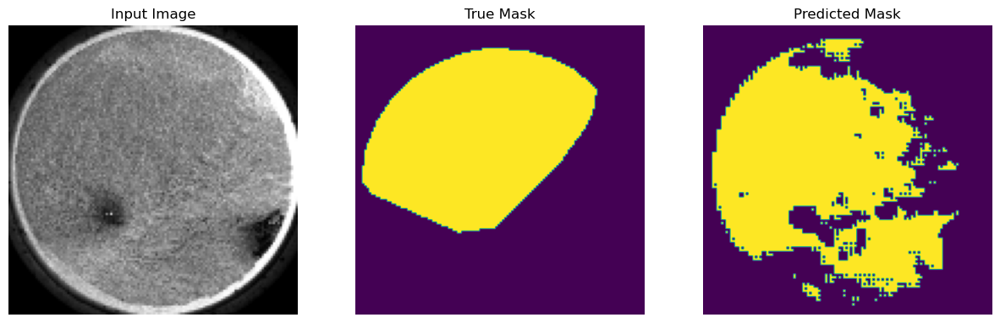


Sample Prediction after epoch 30

6/6 [==============================] - 1s 272ms/step - loss: 0.4759 - accuracy: 0.7816 - val_loss: 0.5230 - val_accuracy: 0.7608
Epoch 31/200
1/1 [==============================] - 0s 55ms/stepss: 0.4864 - accuracy: 0.77


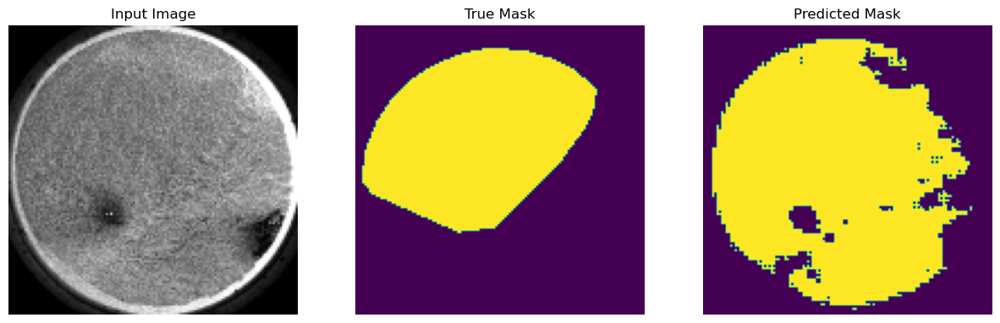


Sample Prediction after epoch 31

6/6 [==============================] - 1s 209ms/step - loss: 0.4864 - accuracy: 0.7750 - val_loss: 0.5141 - val_accuracy: 0.7544
Epoch 32/200
1/1 [==============================] - 0s 61ms/stepss: 0.4774 - accuracy: 0.80


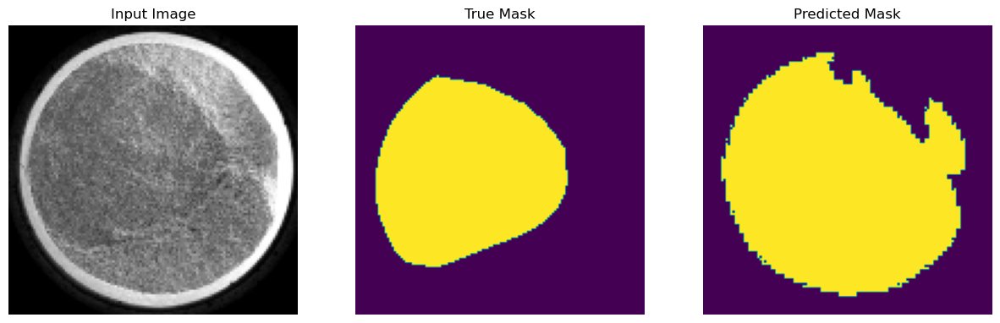


Sample Prediction after epoch 32

6/6 [==============================] - 1s 210ms/step - loss: 0.4774 - accuracy: 0.8017 - val_loss: 0.5128 - val_accuracy: 0.7446
Epoch 33/200
1/1 [==============================] - 0s 196ms/steps: 0.4720 - accuracy: 0.75


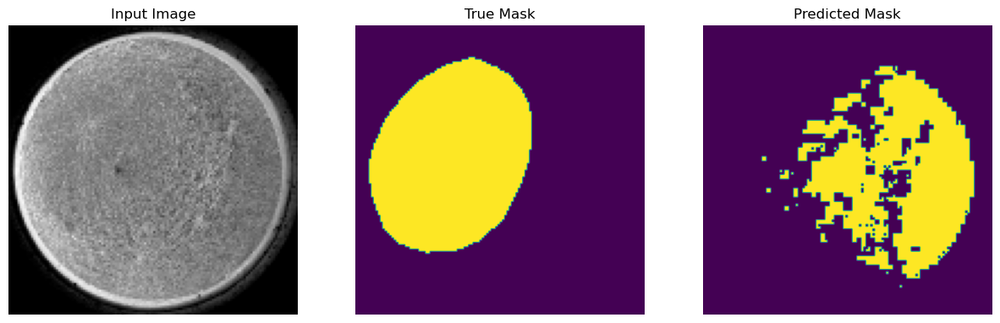


Sample Prediction after epoch 33

6/6 [==============================] - 3s 652ms/step - loss: 0.4720 - accuracy: 0.7536 - val_loss: 0.5516 - val_accuracy: 0.7155
Epoch 34/200
1/1 [==============================] - 0s 184ms/steps: 0.4646 - accuracy: 0.76


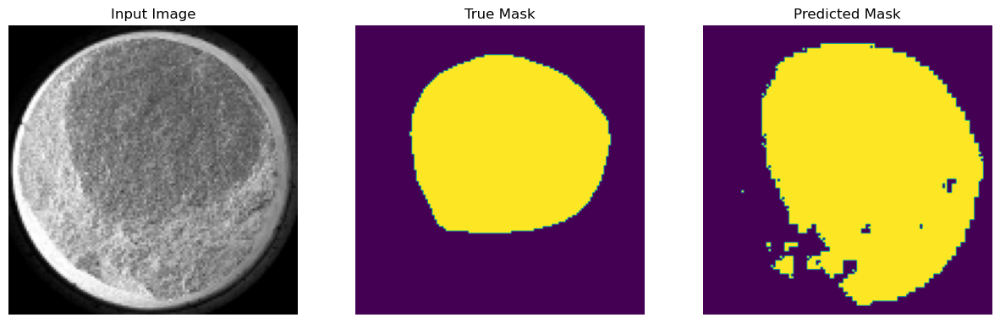


Sample Prediction after epoch 34

6/6 [==============================] - 4s 724ms/step - loss: 0.4646 - accuracy: 0.7655 - val_loss: 0.5174 - val_accuracy: 0.7369
Epoch 35/200
1/1 [==============================] - 0s 55ms/stepss: 0.4828 - accuracy: 0.75


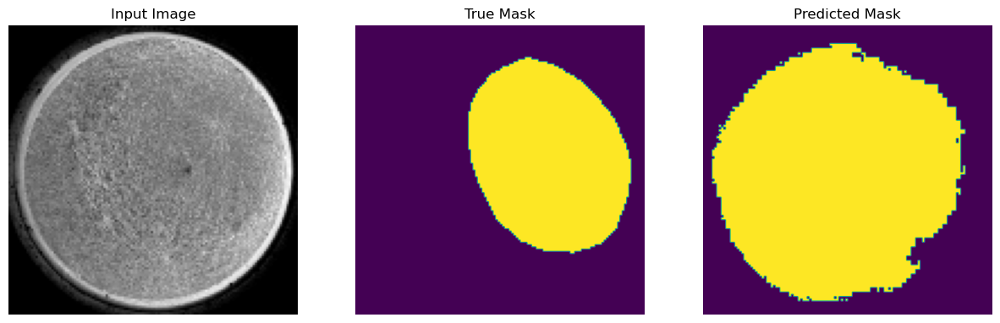


Sample Prediction after epoch 35

6/6 [==============================] - 1s 207ms/step - loss: 0.4920 - accuracy: 0.7570 - val_loss: 0.5094 - val_accuracy: 0.7523
Epoch 36/200
1/1 [==============================] - 0s 55ms/stepss: 0.4744 - accuracy: 0.76


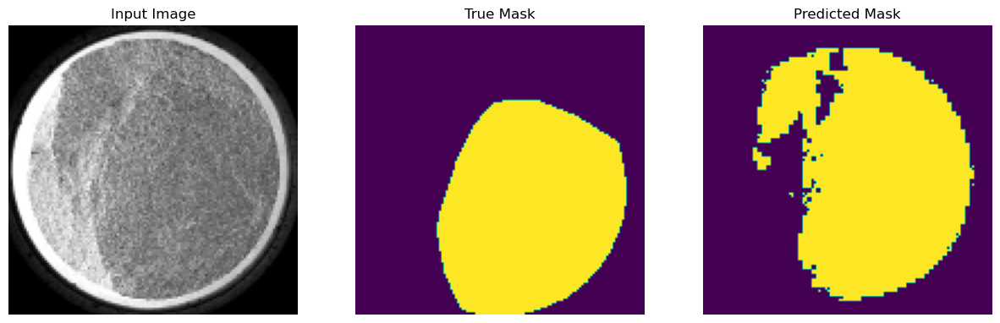


Sample Prediction after epoch 36

6/6 [==============================] - 1s 222ms/step - loss: 0.4744 - accuracy: 0.7655 - val_loss: 0.5070 - val_accuracy: 0.7542
Epoch 37/200
1/1 [==============================] - 0s 56ms/stepss: 0.4809 - accuracy: 0.76


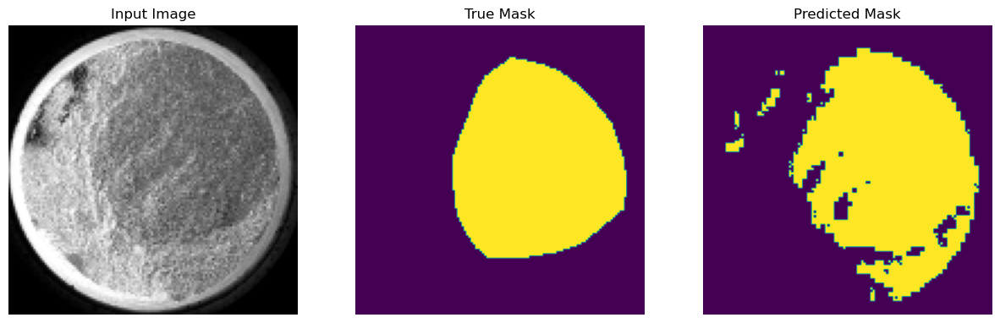


Sample Prediction after epoch 37

6/6 [==============================] - 1s 224ms/step - loss: 0.4809 - accuracy: 0.7683 - val_loss: 0.5079 - val_accuracy: 0.7614
Epoch 38/200
1/1 [==============================] - 0s 55ms/stepss: 0.4577 - accuracy: 0.77


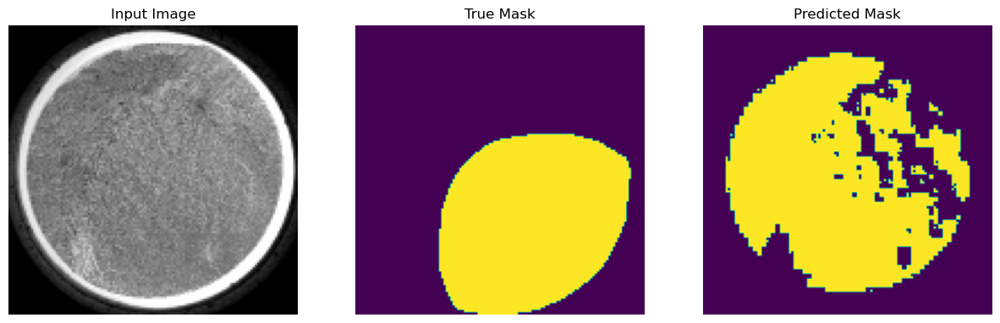


Sample Prediction after epoch 38

6/6 [==============================] - 1s 205ms/step - loss: 0.4577 - accuracy: 0.7781 - val_loss: 0.5122 - val_accuracy: 0.7619
Epoch 39/200
1/1 [==============================] - 0s 55ms/stepss: 0.4638 - accuracy: 0.78


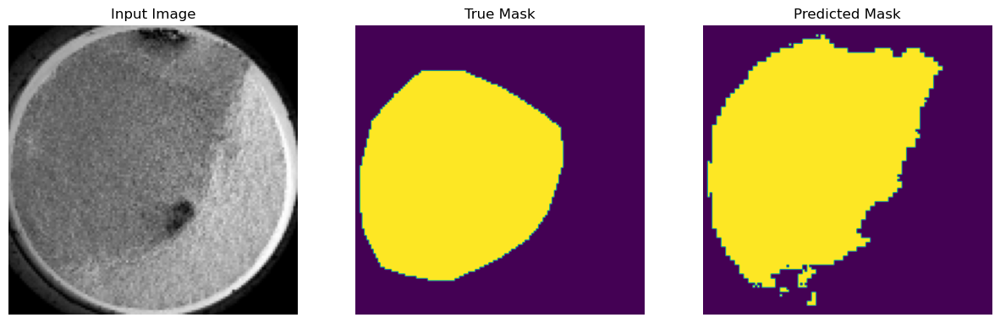


Sample Prediction after epoch 39

6/6 [==============================] - 1s 204ms/step - loss: 0.4638 - accuracy: 0.7830 - val_loss: 0.5105 - val_accuracy: 0.7625
Epoch 40/200
1/1 [==============================] - 0s 55ms/stepss: 0.4526 - accuracy: 0.79


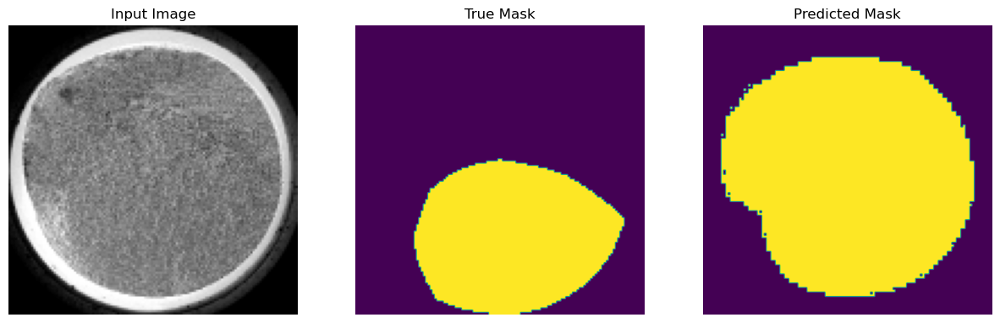


Sample Prediction after epoch 40

6/6 [==============================] - 1s 206ms/step - loss: 0.4526 - accuracy: 0.7998 - val_loss: 0.5076 - val_accuracy: 0.7440
Epoch 41/200
1/1 [==============================] - 0s 60ms/stepss: 0.4578 - accuracy: 0.77


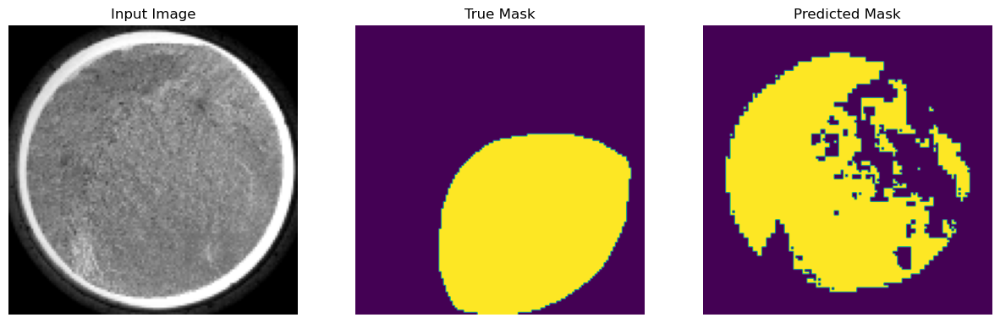


Sample Prediction after epoch 41

6/6 [==============================] - 1s 204ms/step - loss: 0.4578 - accuracy: 0.7785 - val_loss: 0.5096 - val_accuracy: 0.7637
Epoch 42/200
1/1 [==============================] - 0s 55ms/stepss: 0.4571 - accuracy: 0.79


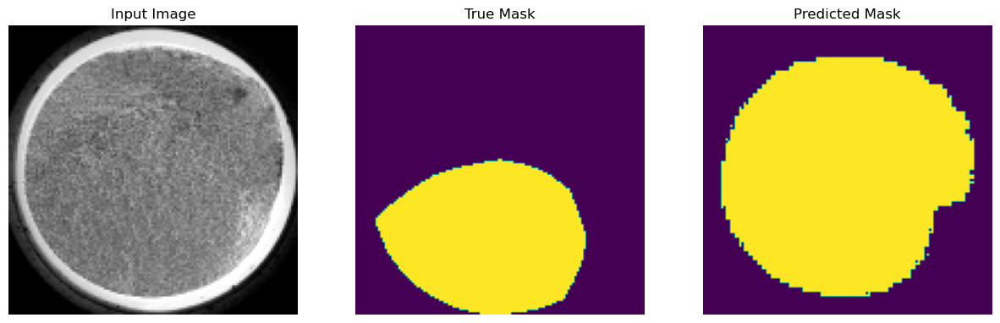


Sample Prediction after epoch 42

6/6 [==============================] - 1s 205ms/step - loss: 0.4628 - accuracy: 0.7835 - val_loss: 0.5056 - val_accuracy: 0.7474
Epoch 43/200
1/1 [==============================] - 0s 188ms/steps: 0.4535 - accuracy: 0.78


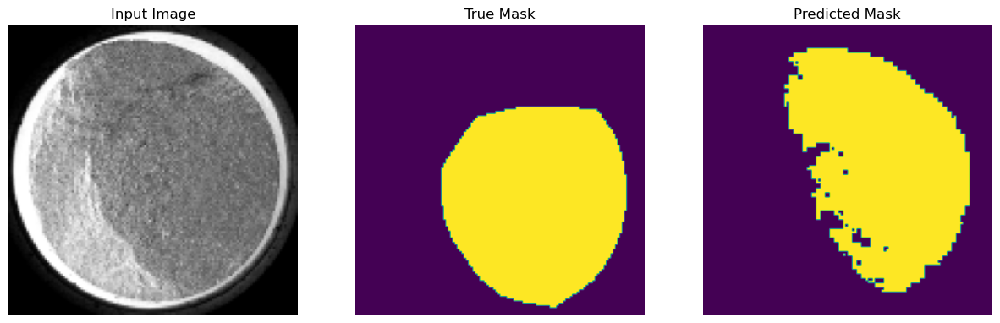


Sample Prediction after epoch 43

6/6 [==============================] - 3s 529ms/step - loss: 0.4535 - accuracy: 0.7821 - val_loss: 0.5176 - val_accuracy: 0.7555
Epoch 44/200
1/1 [==============================] - 0s 184ms/steps: 0.4572 - accuracy: 0.78


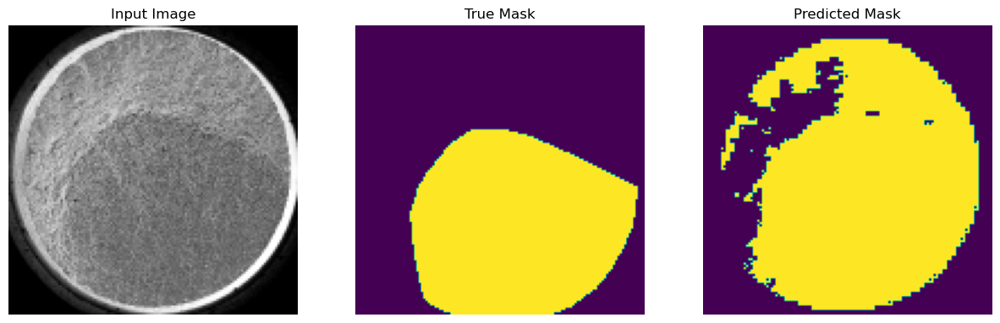


Sample Prediction after epoch 44

6/6 [==============================] - 4s 803ms/step - loss: 0.4572 - accuracy: 0.7878 - val_loss: 0.5042 - val_accuracy: 0.7465
Epoch 45/200
1/1 [==============================] - 0s 54ms/stepss: 0.4588 - accuracy: 0.77


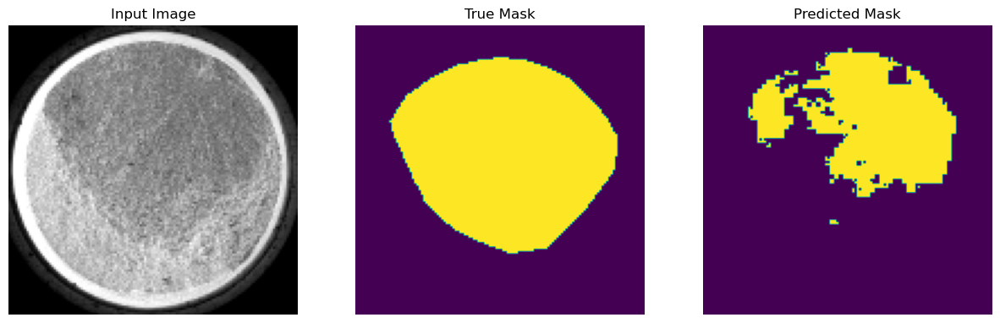


Sample Prediction after epoch 45

6/6 [==============================] - 2s 248ms/step - loss: 0.4588 - accuracy: 0.7770 - val_loss: 0.5075 - val_accuracy: 0.7631
Epoch 46/200
1/1 [==============================] - 0s 57ms/stepss: 0.4616 - accuracy: 0.78


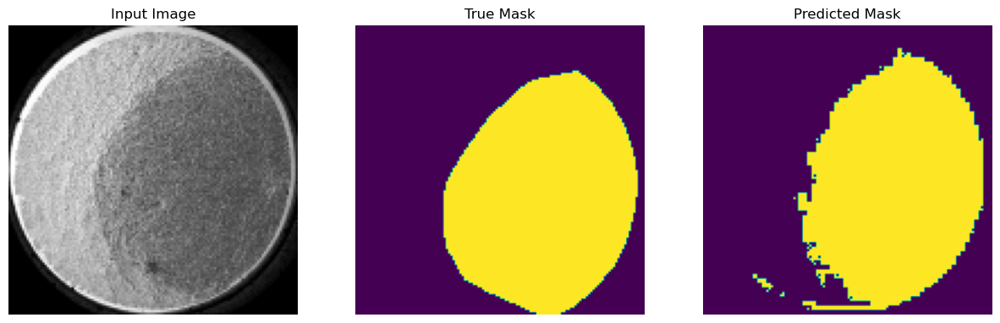


Sample Prediction after epoch 46

6/6 [==============================] - 1s 203ms/step - loss: 0.4616 - accuracy: 0.7848 - val_loss: 0.5023 - val_accuracy: 0.7616
Epoch 47/200
1/1 [==============================] - 0s 57ms/stepss: 0.4498 - accuracy: 0.78


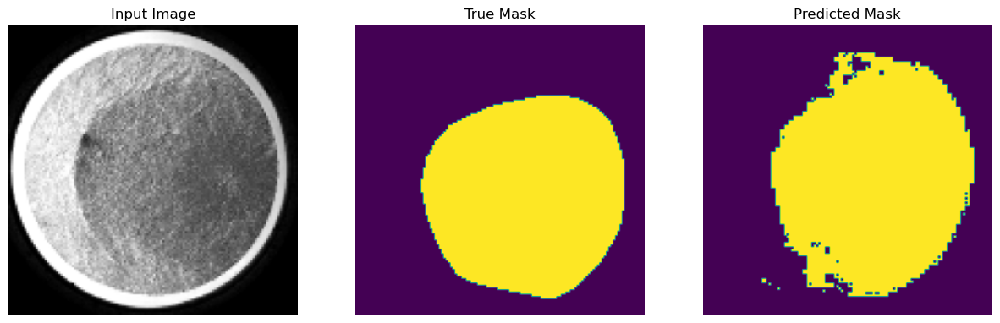


Sample Prediction after epoch 47

6/6 [==============================] - 1s 205ms/step - loss: 0.4498 - accuracy: 0.7821 - val_loss: 0.5251 - val_accuracy: 0.7308
Epoch 48/200
1/1 [==============================] - 0s 58ms/stepss: 0.4475 - accuracy: 0.77


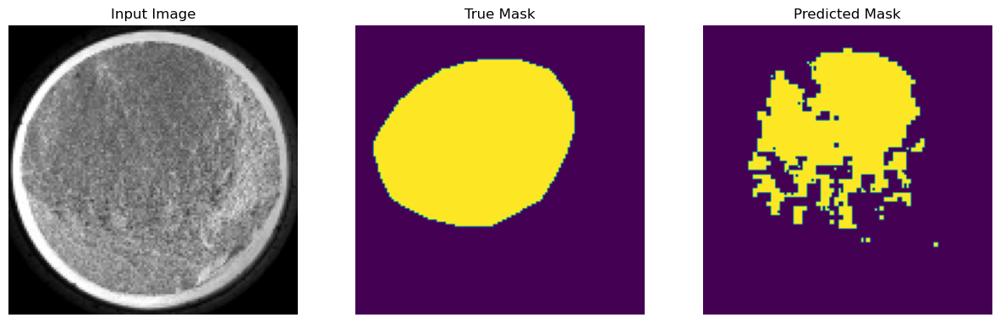


Sample Prediction after epoch 48

6/6 [==============================] - 1s 207ms/step - loss: 0.4475 - accuracy: 0.7781 - val_loss: 0.5457 - val_accuracy: 0.7237
Epoch 49/200
1/1 [==============================] - 0s 56ms/stepss: 0.4808 - accuracy: 0.75


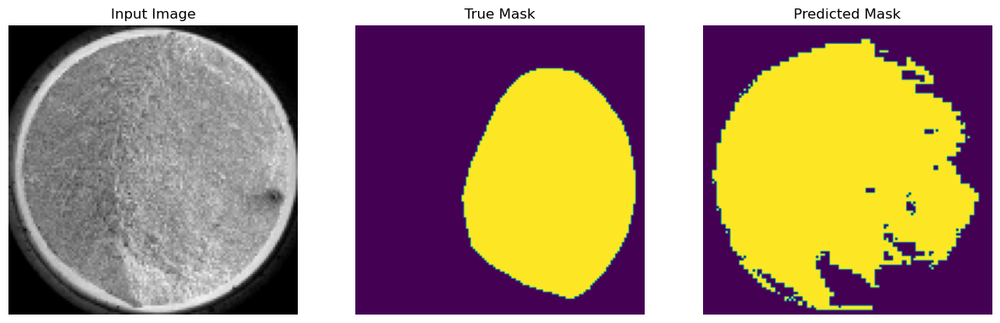


Sample Prediction after epoch 49

6/6 [==============================] - 1s 208ms/step - loss: 0.4769 - accuracy: 0.7572 - val_loss: 0.5044 - val_accuracy: 0.7442
Epoch 50/200
1/1 [==============================] - 0s 61ms/stepss: 0.4548 - accuracy: 0.78


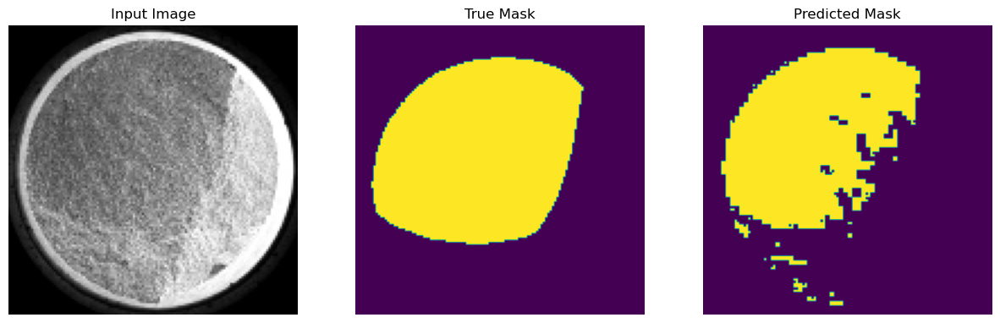


Sample Prediction after epoch 50

6/6 [==============================] - 1s 221ms/step - loss: 0.4548 - accuracy: 0.7806 - val_loss: 0.5066 - val_accuracy: 0.7617
Epoch 51/200
1/1 [==============================] - 0s 56ms/stepss: 0.4214 - accuracy: 0.77


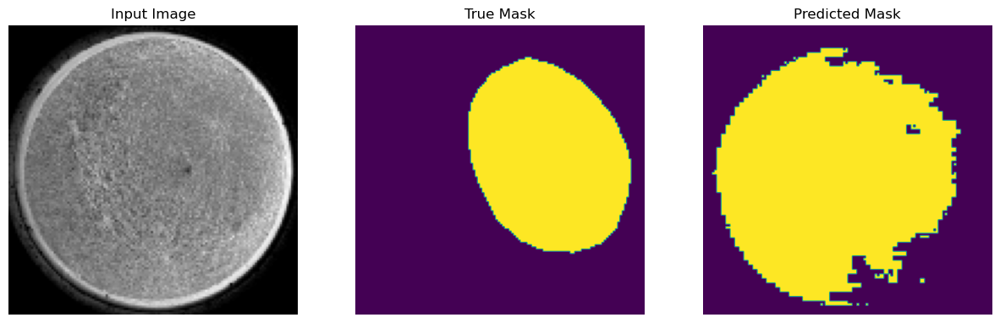


Sample Prediction after epoch 51

6/6 [==============================] - 1s 271ms/step - loss: 0.4214 - accuracy: 0.7720 - val_loss: 0.5063 - val_accuracy: 0.7627
Epoch 52/200
1/1 [==============================] - 0s 57ms/stepss: 0.5470 - accuracy: 0.72


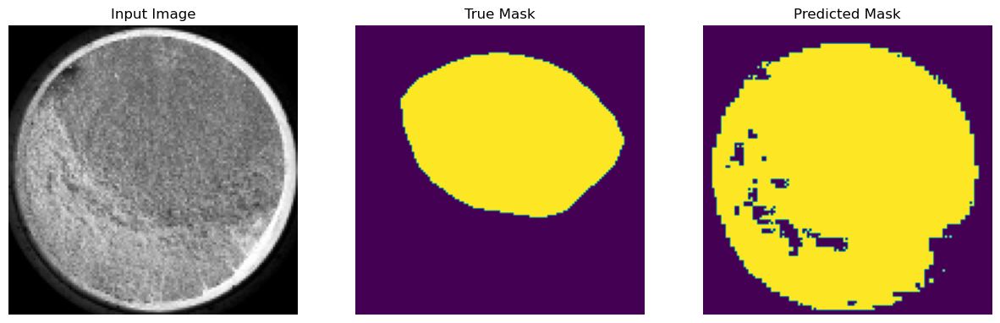


Sample Prediction after epoch 52

6/6 [==============================] - 1s 204ms/step - loss: 0.5470 - accuracy: 0.7260 - val_loss: 0.5291 - val_accuracy: 0.7291
Epoch 53/200
1/1 [==============================] - 0s 57ms/stepss: 0.4594 - accuracy: 0.76


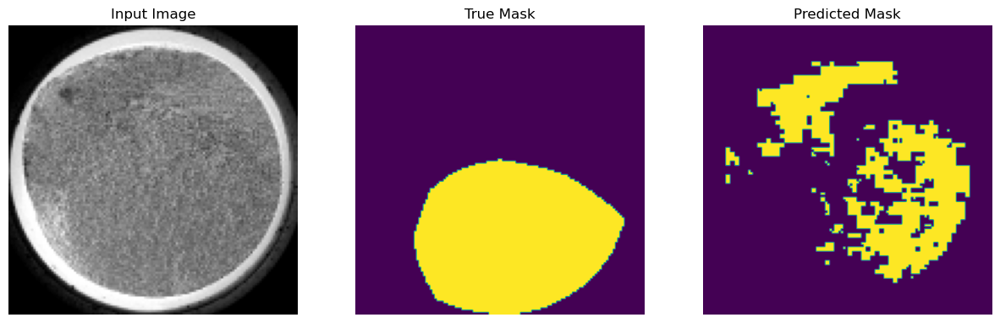


Sample Prediction after epoch 53

6/6 [==============================] - 1s 204ms/step - loss: 0.4594 - accuracy: 0.7674 - val_loss: 0.5454 - val_accuracy: 0.7199
Epoch 54/200
1/1 [==============================] - 0s 56ms/stepss: 0.4878 - accuracy: 0.74


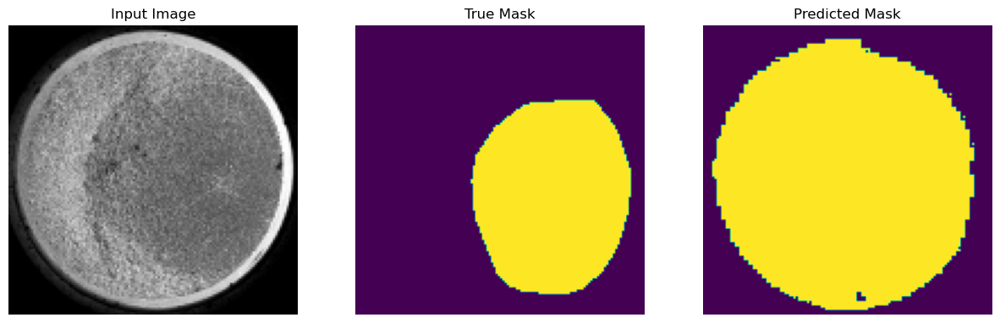


Sample Prediction after epoch 54

6/6 [==============================] - 1s 203ms/step - loss: 0.4878 - accuracy: 0.7410 - val_loss: 0.5326 - val_accuracy: 0.7254
Epoch 55/200
1/1 [==============================] - 0s 57ms/stepss: 0.5063 - accuracy: 0.73


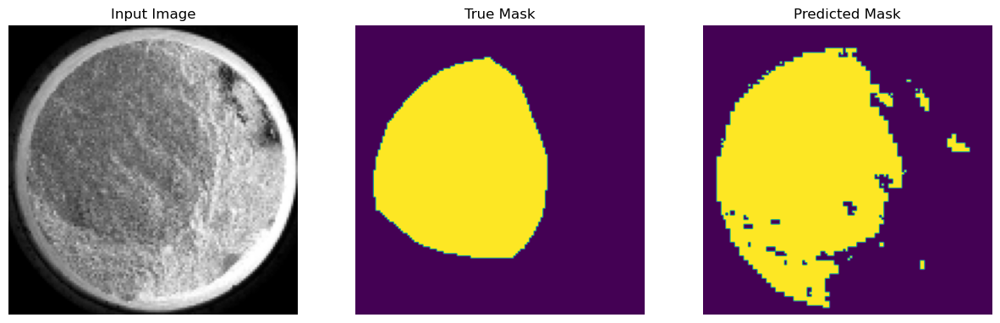


Sample Prediction after epoch 55

6/6 [==============================] - 1s 206ms/step - loss: 0.5063 - accuracy: 0.7371 - val_loss: 0.4994 - val_accuracy: 0.7544
Epoch 56/200
1/1 [==============================] - 0s 57ms/stepss: 0.4211 - accuracy: 0.80


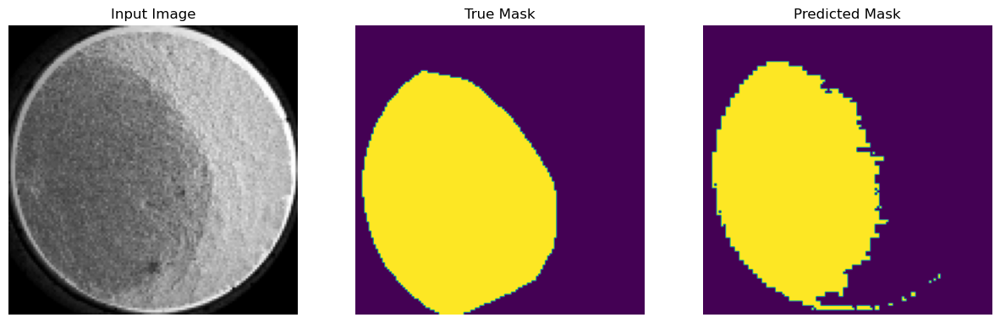


Sample Prediction after epoch 56

6/6 [==============================] - 1s 206ms/step - loss: 0.4233 - accuracy: 0.7980 - val_loss: 0.5160 - val_accuracy: 0.7486
Epoch 57/200
1/1 [==============================] - 0s 56ms/stepss: 0.4591 - accuracy: 0.77


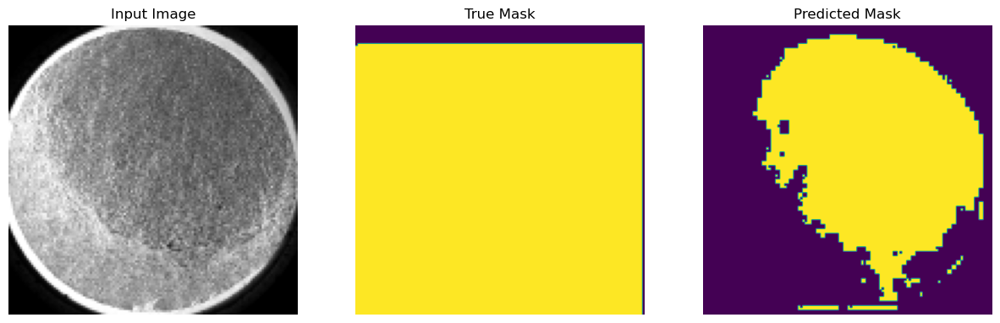


Sample Prediction after epoch 57

6/6 [==============================] - 1s 225ms/step - loss: 0.4591 - accuracy: 0.7727 - val_loss: 0.5004 - val_accuracy: 0.7552
Epoch 58/200
1/1 [==============================] - 0s 60ms/stepss: 0.4659 - accuracy: 0.77


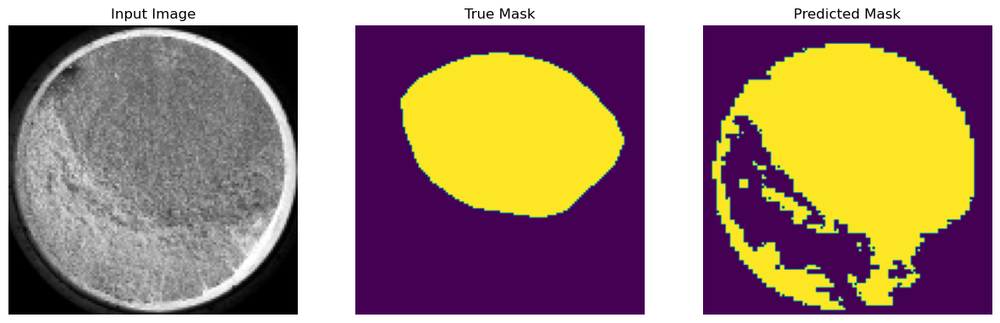


Sample Prediction after epoch 58

6/6 [==============================] - 1s 224ms/step - loss: 0.4659 - accuracy: 0.7718 - val_loss: 0.5041 - val_accuracy: 0.7449
Epoch 59/200
1/1 [==============================] - 0s 59ms/stepss: 0.4699 - accuracy: 0.77


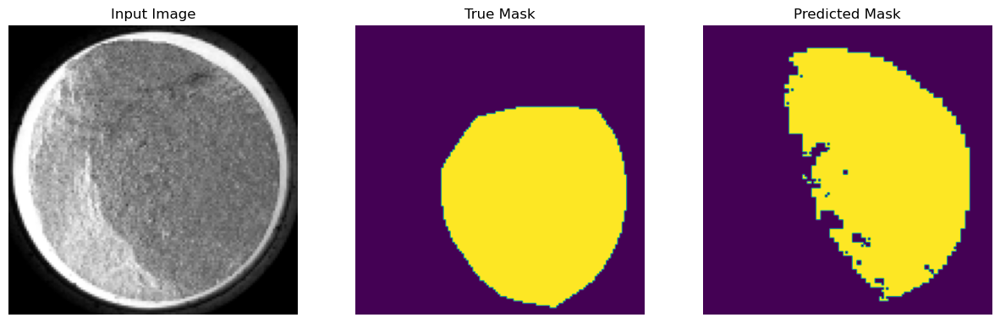


Sample Prediction after epoch 59

6/6 [==============================] - 1s 203ms/step - loss: 0.4699 - accuracy: 0.7776 - val_loss: 0.5134 - val_accuracy: 0.7564
Epoch 60/200
1/1 [==============================] - 0s 55ms/stepss: 0.4025 - accuracy: 0.80


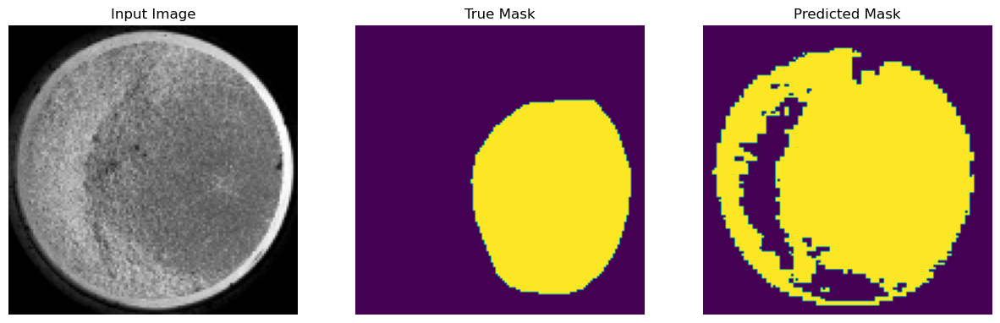


Sample Prediction after epoch 60

6/6 [==============================] - 1s 205ms/step - loss: 0.4025 - accuracy: 0.8078 - val_loss: 0.5034 - val_accuracy: 0.7537
Epoch 61/200
1/1 [==============================] - 0s 57ms/stepss: 0.4577 - accuracy: 0.77


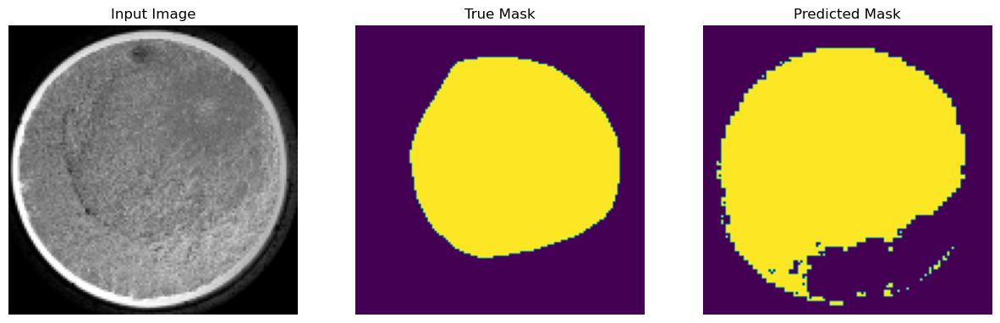


Sample Prediction after epoch 61

6/6 [==============================] - 1s 205ms/step - loss: 0.4577 - accuracy: 0.7766 - val_loss: 0.5001 - val_accuracy: 0.7528
Epoch 62/200
1/1 [==============================] - 0s 58ms/stepss: 0.4659 - accuracy: 0.77


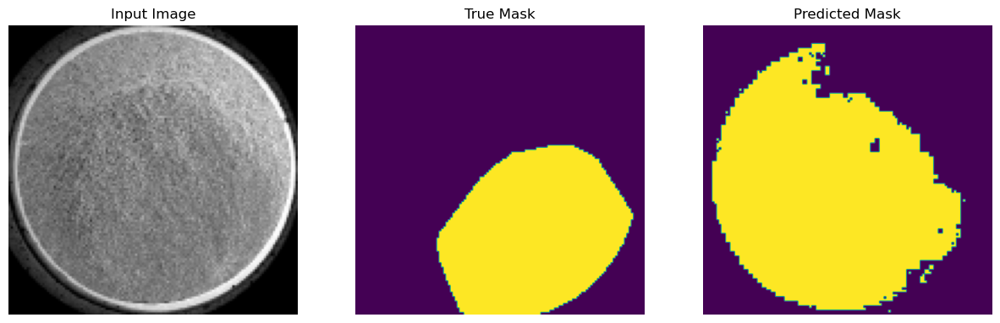


Sample Prediction after epoch 62

6/6 [==============================] - 1s 203ms/step - loss: 0.4659 - accuracy: 0.7722 - val_loss: 0.4975 - val_accuracy: 0.7562
Epoch 63/200
1/1 [==============================] - 0s 55ms/stepss: 0.4544 - accuracy: 0.78


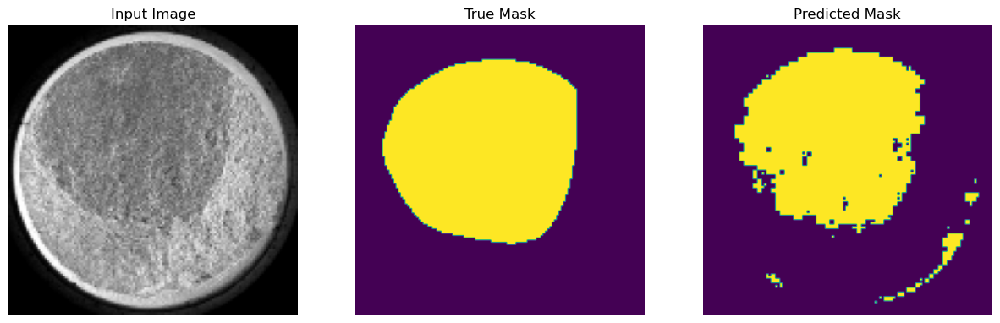


Sample Prediction after epoch 63

6/6 [==============================] - 1s 206ms/step - loss: 0.4499 - accuracy: 0.7892 - val_loss: 0.4962 - val_accuracy: 0.7627
Epoch 64/200
1/1 [==============================] - 0s 56ms/stepss: 0.4468 - accuracy: 0.78


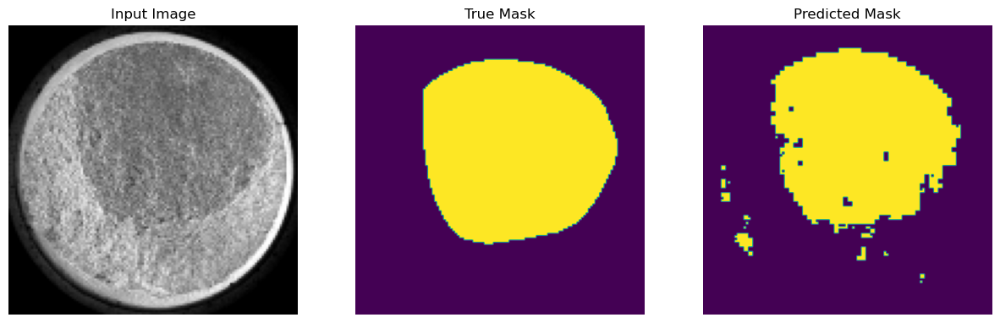


Sample Prediction after epoch 64

6/6 [==============================] - 1s 219ms/step - loss: 0.4468 - accuracy: 0.7897 - val_loss: 0.4958 - val_accuracy: 0.7613
Epoch 65/200
1/1 [==============================] - 0s 53ms/stepss: 0.4538 - accuracy: 0.78


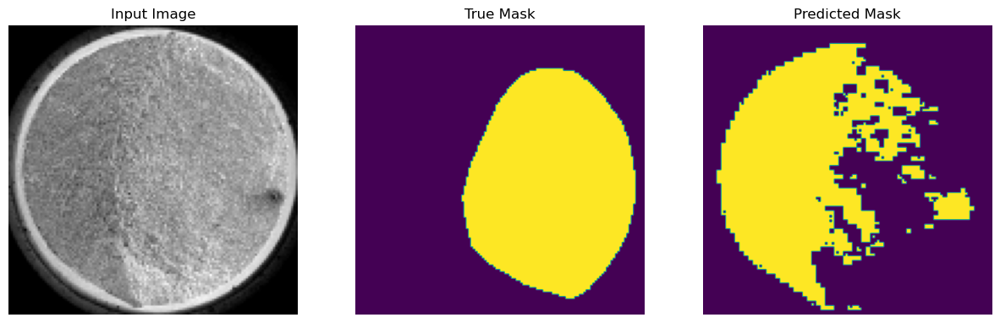


Sample Prediction after epoch 65

6/6 [==============================] - 1s 219ms/step - loss: 0.4538 - accuracy: 0.7809 - val_loss: 0.5001 - val_accuracy: 0.7630
Epoch 66/200
1/1 [==============================] - 0s 58ms/stepss: 0.4359 - accuracy: 0.79


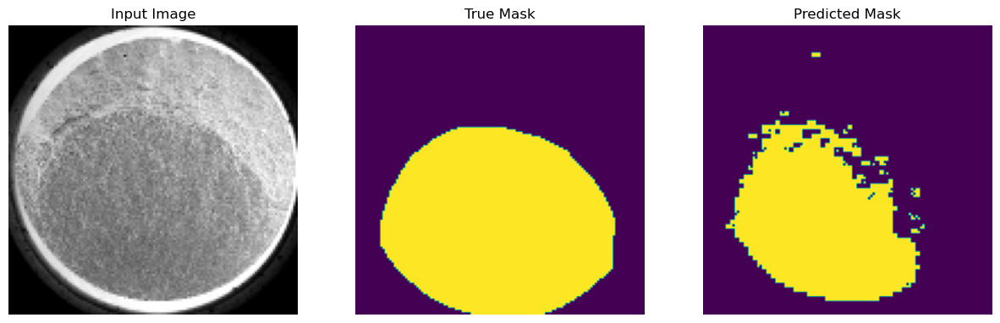


Sample Prediction after epoch 66

6/6 [==============================] - 1s 203ms/step - loss: 0.4359 - accuracy: 0.7937 - val_loss: 0.4968 - val_accuracy: 0.7603
Epoch 67/200
1/1 [==============================] - 0s 55ms/stepss: 0.4188 - accuracy: 0.80


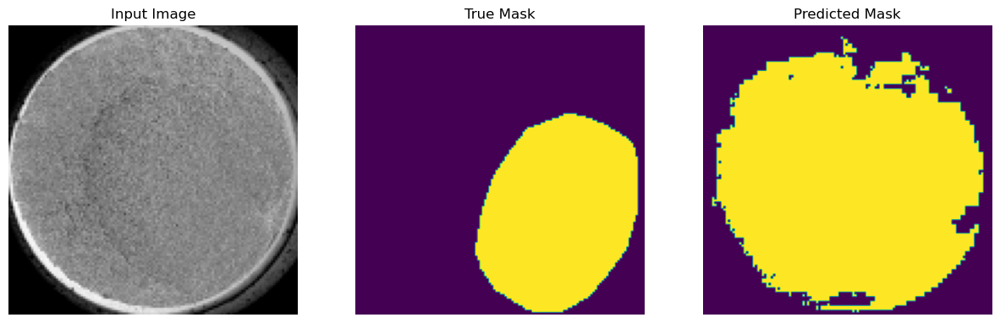


Sample Prediction after epoch 67

6/6 [==============================] - 1s 203ms/step - loss: 0.4188 - accuracy: 0.8051 - val_loss: 0.4990 - val_accuracy: 0.7618
Epoch 68/200
1/1 [==============================] - 0s 56ms/stepss: 0.4669 - accuracy: 0.77


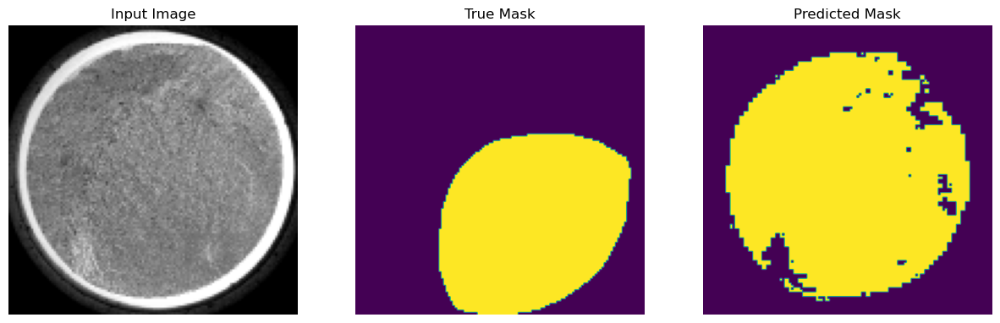


Sample Prediction after epoch 68

6/6 [==============================] - 1s 200ms/step - loss: 0.4669 - accuracy: 0.7758 - val_loss: 0.4998 - val_accuracy: 0.7564
Epoch 69/200
1/1 [==============================] - 0s 61ms/stepss: 0.4353 - accuracy: 0.79


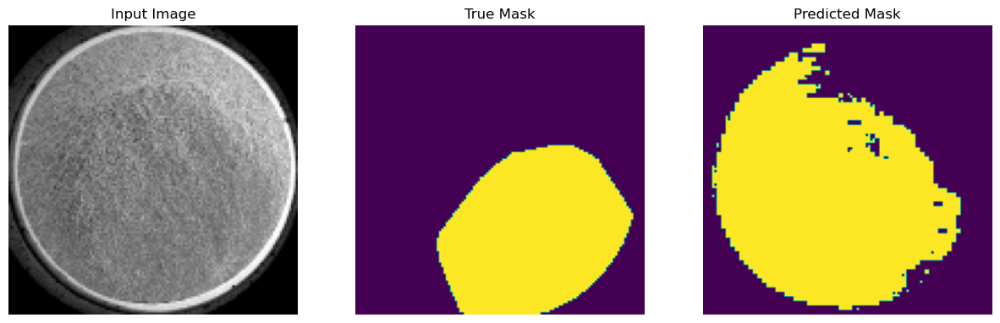


Sample Prediction after epoch 69

6/6 [==============================] - 1s 207ms/step - loss: 0.4353 - accuracy: 0.7959 - val_loss: 0.5009 - val_accuracy: 0.7623
Epoch 70/200
1/1 [==============================] - 0s 55ms/stepss: 0.4486 - accuracy: 0.79


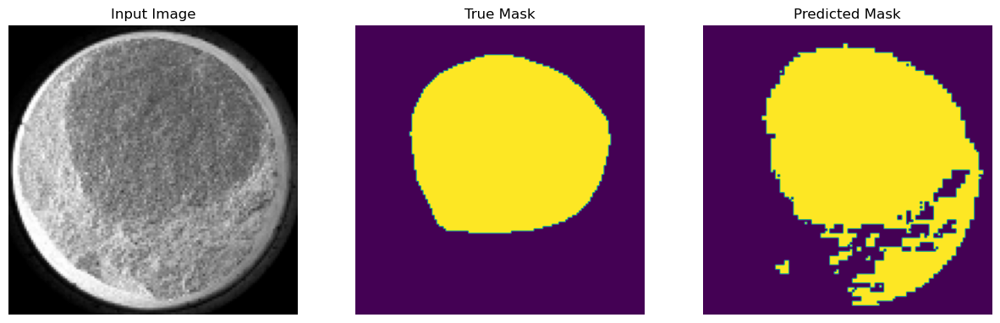


Sample Prediction after epoch 70

6/6 [==============================] - 1s 263ms/step - loss: 0.4507 - accuracy: 0.7866 - val_loss: 0.4989 - val_accuracy: 0.7556
Epoch 71/200
1/1 [==============================] - 0s 55ms/stepss: 0.4564 - accuracy: 0.77


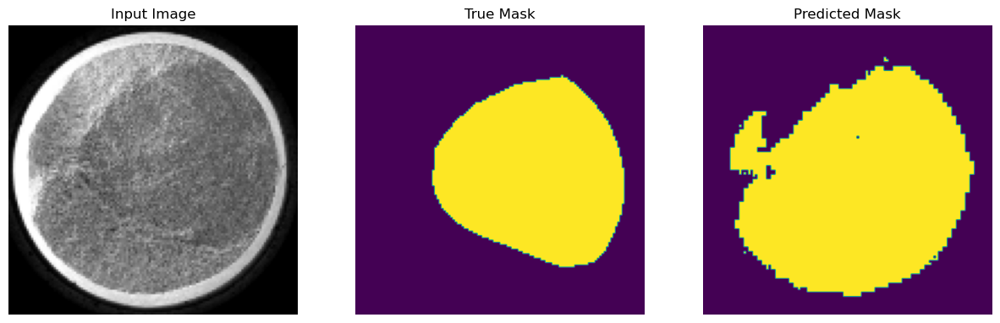


Sample Prediction after epoch 71

6/6 [==============================] - 1s 223ms/step - loss: 0.4564 - accuracy: 0.7771 - val_loss: 0.4977 - val_accuracy: 0.7611
Epoch 72/200
1/1 [==============================] - 0s 58ms/stepss: 0.4698 - accuracy: 0.76


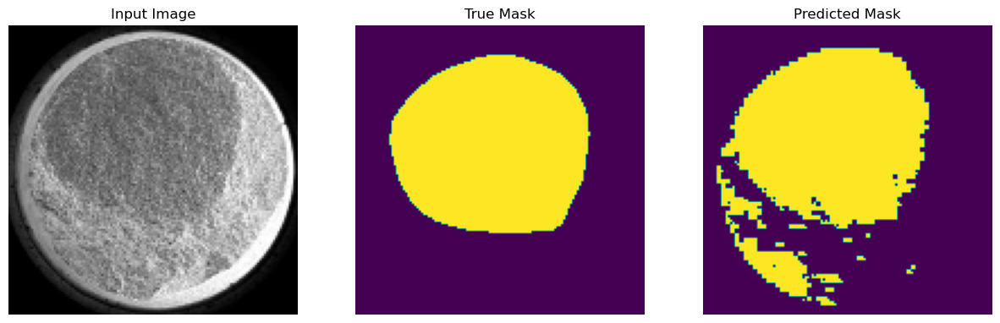


Sample Prediction after epoch 72

6/6 [==============================] - 1s 223ms/step - loss: 0.4698 - accuracy: 0.7679 - val_loss: 0.4986 - val_accuracy: 0.7641
Epoch 73/200
1/1 [==============================] - 0s 56ms/stepss: 0.4175 - accuracy: 0.79


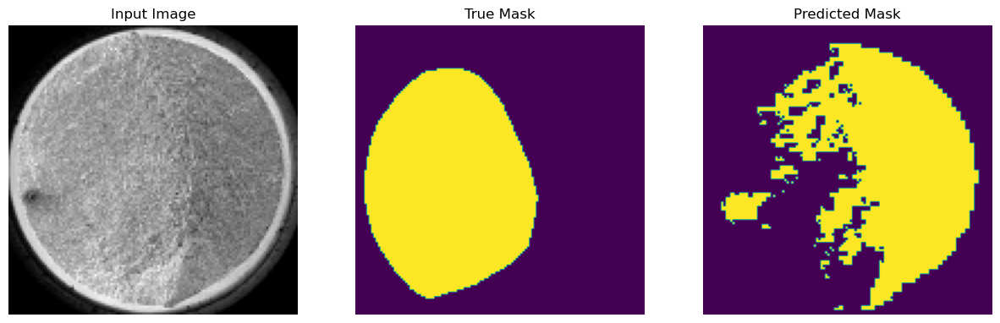


Sample Prediction after epoch 73

6/6 [==============================] - 1s 207ms/step - loss: 0.4175 - accuracy: 0.7959 - val_loss: 0.5004 - val_accuracy: 0.7636
Epoch 74/200
1/1 [==============================] - 0s 55ms/stepss: 0.4558 - accuracy: 0.79


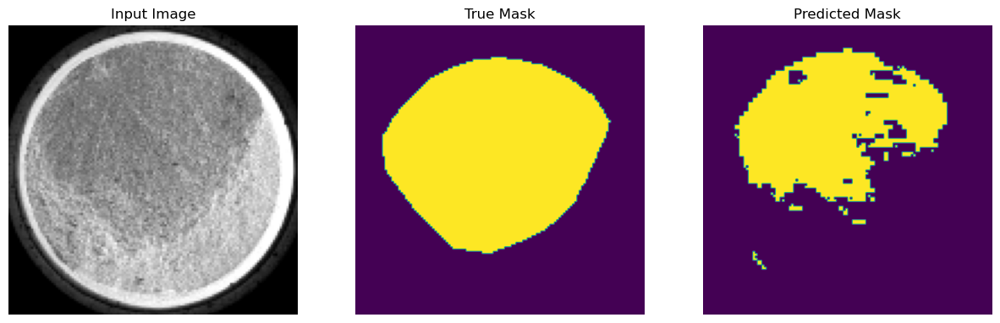


Sample Prediction after epoch 74

6/6 [==============================] - 1s 219ms/step - loss: 0.4558 - accuracy: 0.7905 - val_loss: 0.4983 - val_accuracy: 0.7600


In [112]:
from keras.callbacks import EarlyStopping

EPOCHS = 200
VAL_SUBSPLITS = 5
VALIDATION_STEPS = len(X_test) // BATCH_SIZE
STEPS_PER_EPOCH = len(X_train) // BATCH_SIZE

early_stopping = EarlyStopping(
    monitor='val_loss',  # The metric to monitor (e.g., validation loss)
    patience=10,         # Number of epochs to wait without improvement
    restore_best_weights=True  # Restore the model to the best weights
)

model_history = model.fit(
    train_batches,
    epochs=EPOCHS,
    steps_per_epoch=STEPS_PER_EPOCH,
    validation_steps=VALIDATION_STEPS,
    validation_data=test_batches,
    callbacks=[DisplayCallback(), early_stopping]  # Include early stopping callback
)


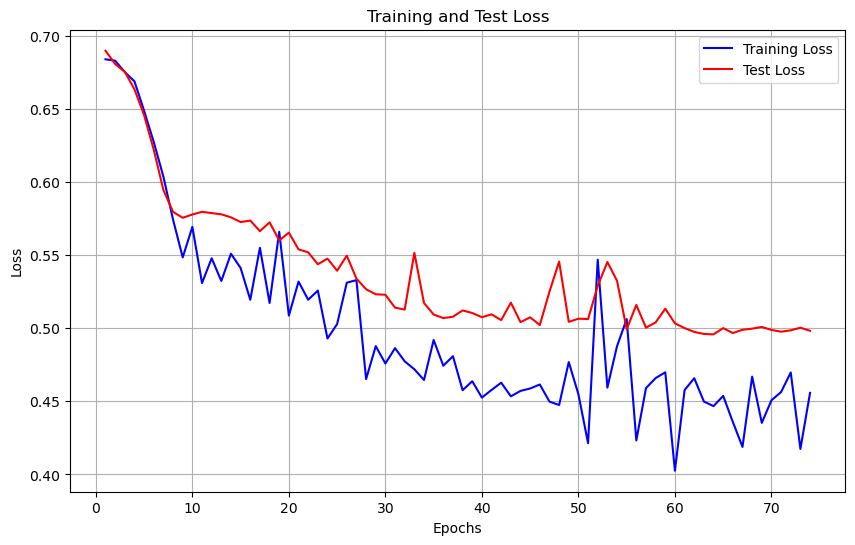

In [113]:
import matplotlib.pyplot as plt

# Extract data from the model history
train_loss = model_history.history['loss']
test_loss = model_history.history['val_loss']

# Create an array of the epoch numbers for the x-axis
epochs = range(1, len(train_loss) + 1)

# Plot the training loss
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, test_loss, 'r', label='Test Loss')
plt.title('Training and Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

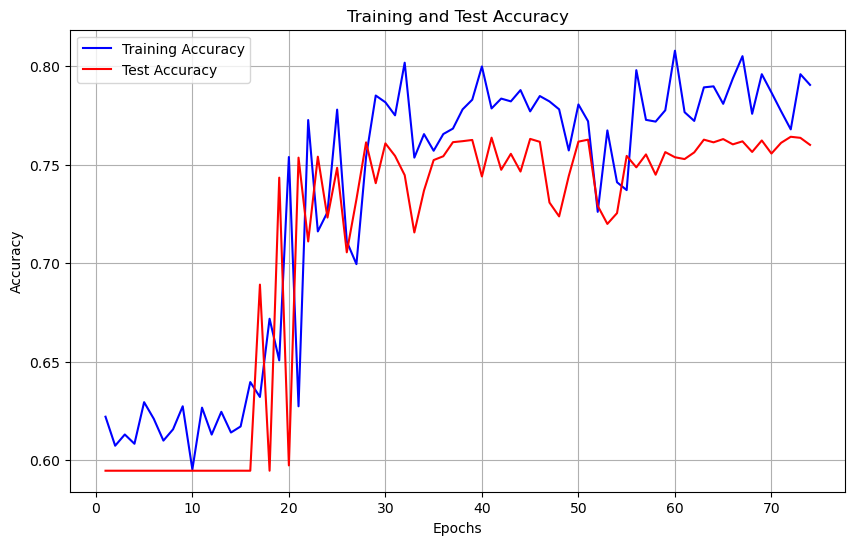

In [114]:
# Plot the training and testing accuracy
train_acc = model_history.history['accuracy']
test_acc = model_history.history['val_accuracy']

plt.figure(figsize=(10, 6))
plt.plot(epochs, train_acc, 'b', label='Training Accuracy')
plt.plot(epochs, test_acc, 'r', label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
plt.show()

In [93]:
# evaluate the model
model.evaluate(test_batches, verbose=1)

2/2 [==============================] - 0s 33ms/step - loss: 0.5207 - accuracy: 0.7409


[0.5207079648971558, 0.7408729195594788]